### Data Preprocessing

In [7]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#supress warnings
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [8]:
crash = pd.read_csv('../input/Statewide_2022/CRASH_Statewide_2022.csv')
# commveh = pd.read_csv('input/Statewide_2022/COMMVEH_Statewide_2022.csv')
cycle = pd.read_csv('../input/Statewide_2022/CYCLE_Statewide_2022.csv')
flag = pd.read_csv('../input/Statewide_2022/FLAG_Statewide_2022.csv')
person = pd.read_csv('../input/Statewide_2022/PERSON_Statewide_2022.csv')
roadway = pd.read_csv('../input/Statewide_2022/ROADWAY_Statewide_2022.csv')
# trailveh = pd.read_csv('input/Statewide_2022/TRAILVEH_Statewide_2022.csv')
vehicle = pd.read_csv('../input/Statewide_2022/VEHICLE_Statewide_2022.csv')

In [9]:
# crash
# Allegheny County code == 2
crash = crash[crash['COUNTY'] == 2]
columns_to_drop = ['ARRIVAL_TM', 'AUTOMOBILE_COUNT', 'BICYCLE_COUNT', 'BICYCLE_DEATH_COUNT', 'BICYCLE_SUSP_SERIOUS_INJ_COUNT', 'BUS_COUNT', 'CHLDPAS_DEATH_COUNT', 'CHLDPAS_SUSP_SERIOUS_INJ_COUNT',
                   'COLLISION_TYPE', 'COMM_VEH_COUNT', 'DISPATCH_TM', 'DISTRICT', 'DRIVER_COUNT_16YR', 'DRIVER_COUNT_17YR', 'DRIVER_COUNT_18YR', 'DRIVER_COUNT_19YR', 'DRIVER_COUNT_20YR', 'DRIVER_COUNT_50_64YR',
                   'DRIVER_COUNT_65_74YR', 'DRIVER_COUNT_75PLUS', 'EST_HRS_CLOSED', 'HEAVY_TRUCK_COUNT', 'HORSE_BUGGY_COUNT', 'INTERSECTION_RELATED', 'LATITUDE', 'LONGITUDE', 'NTFY_HIWY_MAINT',
                   'POLICE_AGCY', 'ROADWAY_CLEARED', 'SCH_BUS_IND', 'SCH_ZONE_IND', 'SMALL_TRUCK_COUNT', 'SPEC_JURIS_CD', 'SUV_COUNT', 'TCD_FUNC_CD', 'TCD_TYPE', 'TFC_DETOUR_IND', 'TIME_OF_DAY', 'VAN_COUNT',
                   'VEHICLE_COUNT']
crash.drop(columns=columns_to_drop, inplace=True)
crash.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11589 entries, 41 to 115982
Data columns (total 60 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CRN                             11589 non-null  int64  
 1   BELTED_DEATH_COUNT              11589 non-null  int64  
 2   BELTED_SUSP_SERIOUS_INJ_COUNT   11589 non-null  int64  
 3   CONS_ZONE_SPD_LIM               195 non-null    float64
 4   COUNTY                          11589 non-null  int64  
 5   CRASH_MONTH                     11589 non-null  int64  
 6   CRASH_YEAR                      11589 non-null  int64  
 7   DAY_OF_WEEK                     11589 non-null  int64  
 8   DEC_LAT                         11570 non-null  float64
 9   DEC_LONG                        11562 non-null  float64
 10  FATAL_COUNT                     11589 non-null  int64  
 11  HOUR_OF_DAY                     11588 non-null  float64
 12  ILLUMINATION                    115

In [10]:
# flag
columns_to_keep = ['AGGRESSIVE_DRIVING', 'ALCOHOL_RELATED', 'ANGLE_CRASH', 'BACKUP_NONRECURRING', 'BACKUP_CONGESTION', 'BICYCLE', 'CRN', 'CROSS_MEDIAN', 'CURVE_DVR_ERROR', 'CURVED_ROAD',
                   'DEER_RELATED', 'DISTRACTED', 'DRINKING_DRIVER', 'DRIVER_16YR', 'DRIVER_17YR', 'DRIVER_18YR', 'DRIVER_19YR', 'DRIVER_20YR', 'DRIVER_50_64YR', 'DRIVER_65_74YR', 
                   'DRIVER_75PLUS', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'ICY_ROAD', 'ILLUMINATION_DARK', 'INTERSECTION', 'INTERSTATE', 'LANE_DEPARTURE', 'LEFT_TURN', 'LIMIT_65MPH',
                   'LIMIT_70MPH', 'MARIJUANA_RELATED', 'RAMP', 'RAMP_SEGMENT', 'REAR_END', 'ROUNDABOUT', 'RUNNING_RED_LT', 'RUNNING_STOP_SIGN', 'SPEEDING', 'SPEEDING_RELATED',
                   'UNBELTED', 'UNDERAGE_DRNK_DRV', 'VULNERABLE_ROAD_USER_FATAL', 'WET_ROAD', 'WORK_ZONE', 'YOUNG_DRIVER']
flag = flag[columns_to_keep]
flag.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116030 entries, 0 to 116029
Data columns (total 46 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   AGGRESSIVE_DRIVING          116030 non-null  int64  
 1   ALCOHOL_RELATED             116030 non-null  int64  
 2   ANGLE_CRASH                 116030 non-null  int64  
 3   BACKUP_NONRECURRING         116030 non-null  int64  
 4   BACKUP_CONGESTION           116030 non-null  int64  
 5   BICYCLE                     116030 non-null  int64  
 6   CRN                         116030 non-null  int64  
 7   CROSS_MEDIAN                116030 non-null  int64  
 8   CURVE_DVR_ERROR             116030 non-null  int64  
 9   CURVED_ROAD                 116030 non-null  int64  
 10  DEER_RELATED                116030 non-null  int64  
 11  DISTRACTED                  116030 non-null  int64  
 12  DRINKING_DRIVER             116030 non-null  int64  
 13  DRIVER_16YR   

In [11]:
# person
columns_to_keep = ['AGE', 'CRN', 'SEX', 'VULNERABLE_ROAD_USER']
person = person[columns_to_keep]
person.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253838 entries, 0 to 253837
Data columns (total 4 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   AGE                   253838 non-null  int64 
 1   CRN                   253838 non-null  int64 
 2   SEX                   253838 non-null  object
 3   VULNERABLE_ROAD_USER  253838 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 7.7+ MB


In [12]:
# roadway
columns_to_keep = ['CRN', 'SPEED_LIMIT', 'STREET_NAME']
roadway = roadway[columns_to_keep]
roadway.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181440 entries, 0 to 181439
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   CRN          181440 non-null  int64  
 1   SPEED_LIMIT  174330 non-null  float64
 2   STREET_NAME  181247 non-null  object 
dtypes: float64(1), int64(1), object(1)
memory usage: 4.2+ MB


In [13]:
# vehicle
columns_to_keep = ['AVOID_MAN_CD', 'CRN', 'MAKE_CD', 'MODEL_YR', 'OWNER_DRIVER', 'VEH_COLOR_CD', 'VEH_MOVEMENT', 'VEH_POSITION', 'VEH_REG_STATE']
vehicle = vehicle[columns_to_keep]
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206475 entries, 0 to 206474
Data columns (total 9 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   AVOID_MAN_CD   1757 non-null    float64
 1   CRN            206475 non-null  int64  
 2   MAKE_CD        200494 non-null  object 
 3   MODEL_YR       198047 non-null  float64
 4   OWNER_DRIVER   191752 non-null  float64
 5   VEH_COLOR_CD   202105 non-null  float64
 6   VEH_MOVEMENT   203001 non-null  float64
 7   VEH_POSITION   202959 non-null  float64
 8   VEH_REG_STATE  199835 non-null  object 
dtypes: float64(6), int64(1), object(2)
memory usage: 14.2+ MB


Clean the crash dataframe first. It will be the basis of merge dataset.

In [14]:
# drop the columns with more than 60% missing values
threshold = 0.6
crash.dropna(axis='columns', thresh=int(threshold * len(crash)), inplace=True)

In [15]:
# 99 in HOUR_OF_DAY represents unknown
crash['HOUR_OF_DAY'] = crash['HOUR_OF_DAY'].replace(99, np.nan)

mean_hour = crash['HOUR_OF_DAY'].mean()
crash['HOUR_OF_DAY'] = crash['HOUR_OF_DAY'].fillna(mean_hour)

In [16]:
crash.isna().sum()

CRN                                0
BELTED_DEATH_COUNT                 0
BELTED_SUSP_SERIOUS_INJ_COUNT      0
COUNTY                             0
CRASH_MONTH                        0
CRASH_YEAR                         0
DAY_OF_WEEK                        0
DEC_LAT                           19
DEC_LONG                          27
FATAL_COUNT                        0
HOUR_OF_DAY                        0
ILLUMINATION                       0
INJURY_COUNT                       0
INTERSECT_TYPE                     0
LANE_CLOSED                        0
LOCATION_TYPE                      0
MAX_SEVERITY_LEVEL                 0
MCYCLE_DEATH_COUNT                 0
MCYCLE_SUSP_SERIOUS_INJ_COUNT      0
MOTORCYCLE_COUNT                   0
MUNICIPALITY                       0
NONMOTR_COUNT                      0
NONMOTR_DEATH_COUNT                0
NONMOTR_SUSP_SERIOUS_INJ_COUNT     0
PED_COUNT                          0
PED_DEATH_COUNT                    0
PED_SUSP_SERIOUS_INJ_COUNT         0
P

In [17]:
# drop the rows with missing lat, long and hod since they can not be imputed
crash.dropna(inplace=True)
crash.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11555 entries, 41 to 115982
Data columns (total 45 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CRN                             11555 non-null  int64  
 1   BELTED_DEATH_COUNT              11555 non-null  int64  
 2   BELTED_SUSP_SERIOUS_INJ_COUNT   11555 non-null  int64  
 3   COUNTY                          11555 non-null  int64  
 4   CRASH_MONTH                     11555 non-null  int64  
 5   CRASH_YEAR                      11555 non-null  int64  
 6   DAY_OF_WEEK                     11555 non-null  int64  
 7   DEC_LAT                         11555 non-null  float64
 8   DEC_LONG                        11555 non-null  float64
 9   FATAL_COUNT                     11555 non-null  int64  
 10  HOUR_OF_DAY                     11555 non-null  float64
 11  ILLUMINATION                    11555 non-null  int64  
 12  INJURY_COUNT                    115

merge crash, flag, cycle and roadway. person and vehicle are not unique to on CRN, so analyze them seperately.

In [18]:
# features in flag, cycle and roadway are unique to one crash record, combine these three dataframes with crash
merged_df = crash
dataframes = [flag, cycle, roadway]
for df in dataframes:
    merged_df = merged_df.merge(df, on='CRN', how='left')
print('duplicate pairs:', merged_df.duplicated('CRN').sum())
merged_df.info()

duplicate pairs: 7312
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18867 entries, 0 to 18866
Columns: 116 entries, CRN to STREET_NAME
dtypes: float64(53), int64(40), object(23)
memory usage: 16.7+ MB


In [19]:
# print out sample duplicate pairs
groups = merged_df.groupby('CRN')
cnt = 0
for name, group in groups:
    if cnt == 3: break
    if len(group) > 1:
        print(f"CRN: {name}")
        print(group[['CRN', 'STREET_NAME']])
        print("\n")
        cnt += 1

CRN: 2022000055
              CRN STREET_NAME
18098  2022000055  BINGHAM ST
18099  2022000055     16TH ST


CRN: 2022000101
             CRN    STREET_NAME
6968  2022000101     PAULSON AV
6969  2022000101  FRANKSTOWN AV


CRN: 2022000104
             CRN                STREET_NAME
7222  2022000104  RAMP J RD/TO DUQ/MCKPT BR
7223  2022000104                     ELM ST
7224  2022000104                  BOWMAN AV




In [20]:
# dropping duplicates, keeping the first occurrence
merged_df = merged_df.drop_duplicates(subset=['CRN'], keep='first')
print('duplicate pairs:', merged_df.duplicated('CRN').sum())

duplicate pairs: 0


In [21]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11555 entries, 0 to 18864
Columns: 116 entries, CRN to STREET_NAME
dtypes: float64(53), int64(40), object(23)
memory usage: 10.3+ MB


In [22]:
df = merged_df.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11555 entries, 0 to 18864
Columns: 116 entries, CRN to STREET_NAME
dtypes: float64(53), int64(40), object(23)
memory usage: 10.3+ MB


In [23]:
# drop the columns with more than 60% missing values
threshold = 0.6
df.dropna(axis='columns', thresh=int(threshold * len(df)), inplace=True)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11555 entries, 0 to 18864
Data columns (total 92 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CRN                             11555 non-null  int64  
 1   BELTED_DEATH_COUNT              11555 non-null  int64  
 2   BELTED_SUSP_SERIOUS_INJ_COUNT   11555 non-null  int64  
 3   COUNTY                          11555 non-null  int64  
 4   CRASH_MONTH                     11555 non-null  int64  
 5   CRASH_YEAR                      11555 non-null  int64  
 6   DAY_OF_WEEK                     11555 non-null  int64  
 7   DEC_LAT                         11555 non-null  float64
 8   DEC_LONG                        11555 non-null  float64
 9   FATAL_COUNT                     11555 non-null  int64  
 10  HOUR_OF_DAY                     11555 non-null  float64
 11  ILLUMINATION                    11555 non-null  int64  
 12  INJURY_COUNT                    11555

In [25]:
# first drop the rows with missing street name or speed limit
df.dropna(subset=['STREET_NAME', 'SPEED_LIMIT'], inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11438 entries, 0 to 18864
Data columns (total 92 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CRN                             11438 non-null  int64  
 1   BELTED_DEATH_COUNT              11438 non-null  int64  
 2   BELTED_SUSP_SERIOUS_INJ_COUNT   11438 non-null  int64  
 3   COUNTY                          11438 non-null  int64  
 4   CRASH_MONTH                     11438 non-null  int64  
 5   CRASH_YEAR                      11438 non-null  int64  
 6   DAY_OF_WEEK                     11438 non-null  int64  
 7   DEC_LAT                         11438 non-null  float64
 8   DEC_LONG                        11438 non-null  float64
 9   FATAL_COUNT                     11438 non-null  int64  
 10  HOUR_OF_DAY                     11438 non-null  float64
 11  ILLUMINATION                    11438 non-null  int64  
 12  INJURY_COUNT                    11438

In [26]:
# the rest columns with missing values are binary features, use mode to fill the null values
mode_values = df.mode().iloc[0]
df = df.fillna(mode_values)

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11438 entries, 0 to 18864
Data columns (total 92 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CRN                             11438 non-null  int64  
 1   BELTED_DEATH_COUNT              11438 non-null  int64  
 2   BELTED_SUSP_SERIOUS_INJ_COUNT   11438 non-null  int64  
 3   COUNTY                          11438 non-null  int64  
 4   CRASH_MONTH                     11438 non-null  int64  
 5   CRASH_YEAR                      11438 non-null  int64  
 6   DAY_OF_WEEK                     11438 non-null  int64  
 7   DEC_LAT                         11438 non-null  float64
 8   DEC_LONG                        11438 non-null  float64
 9   FATAL_COUNT                     11438 non-null  int64  
 10  HOUR_OF_DAY                     11438 non-null  float64
 11  ILLUMINATION                    11438 non-null  int64  
 12  INJURY_COUNT                    11438

In [28]:
df.to_csv('output/crash_flag_cycle.csv', index=False)

### Geo Analysis

In [29]:
import folium
from folium.plugins import MarkerCluster
def create_map(df_loc, latitude, longitude, zoom, tiles='OpenStreetMap'):
    """
    Generate a Folium Map with clustered markers of accident locations.
    """
    world_map = folium.Map(location=[latitude, longitude], zoom_start=zoom, tiles=tiles)
    marker_cluster = MarkerCluster().add_to(world_map)

    # Iterate over the DataFrame rows and add each marker to the cluster
    for idx, row in df_loc.iterrows():
        folium.Marker(
            location=[row['DEC_LAT'], row['DEC_LONG']],
            popup=f"Lat, Lng: {row['DEC_LAT']}, {row['DEC_LONG']}, DOW & HOD: {row['DAY_OF_WEEK'], row['HOUR_OF_DAY']}, Street: {row['STREET_NAME']}"
        ).add_to(marker_cluster)

    return world_map

In [30]:
pitts_coords = {"lat": 40.4406, "lon": -79.9959} # Coordinates for Pittsburgh
map_ls = create_map(df, pitts_coords['lat'], pitts_coords['lon'], 10, tiles="cartodbpositron" )
map_ls

0 – Not applicable 1 – Underpass 2 – Ramp 3 – Bridge 4 – Tunnel 7 – Driveway or Parking Lot 8 – Ramp and bridge

<Axes: xlabel='LOCATION_TYPE'>

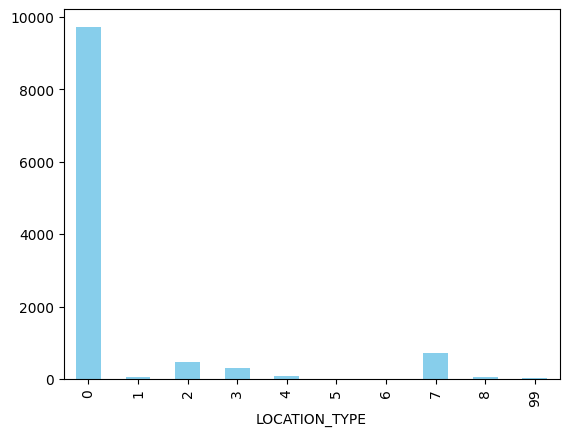

In [83]:
df.groupby('LOCATION_TYPE')['CRN'].count().plot(kind='bar', color='skyblue')

In [84]:
location_injury = df.groupby('LOCATION_TYPE')['INJURY_COUNT'].sum()
print(location_injury)

LOCATION_TYPE
0     4848
1       20
2      244
3      169
4       45
5        3
6        3
7      417
8       23
99      18
Name: INJURY_COUNT, dtype: int64


In [86]:
print(len(df['MUNICIPALITY'].unique()))

121


### Time Analysis

In [31]:
print(crash['CRASH_YEAR'].unique(), df['CRASH_YEAR'].unique())

[2022] [2022]


<Axes: xlabel='CRASH_MONTH'>

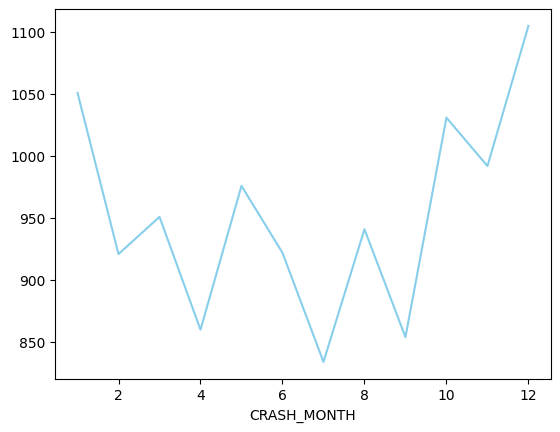

In [32]:
df.groupby('CRASH_MONTH')['CRN'].count().plot(kind='line', color='skyblue')

<Axes: xlabel='DAY_OF_WEEK', ylabel='count'>

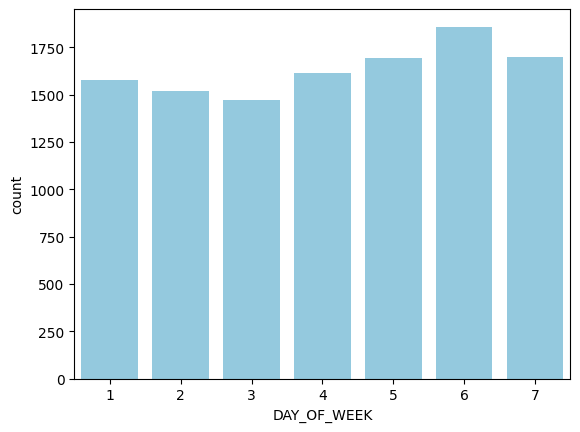

In [33]:
sns.countplot(x='DAY_OF_WEEK', data=df, color='skyblue')

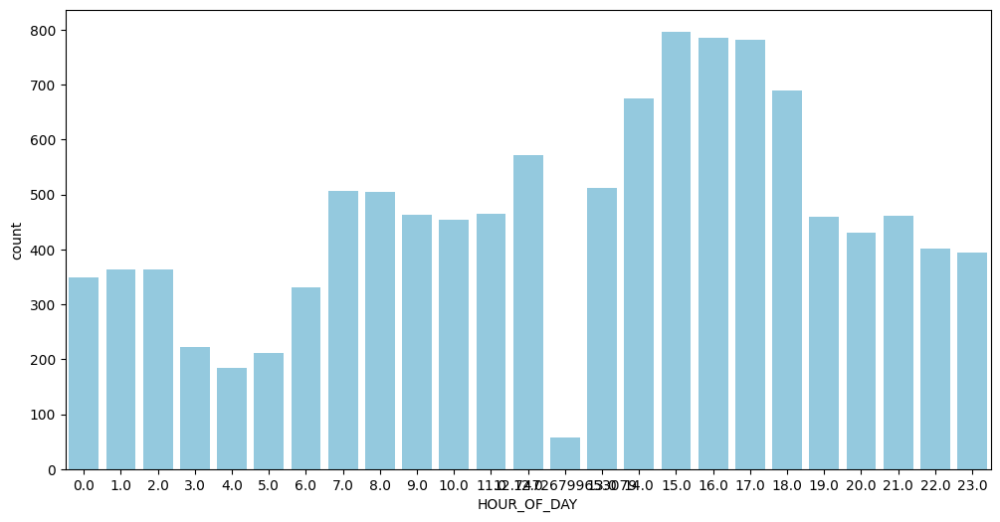

In [34]:
plt.figure(figsize=(12, 6))
sns.countplot(x='HOUR_OF_DAY', data=df, color='skyblue')
plt.show()

(21339, 93)


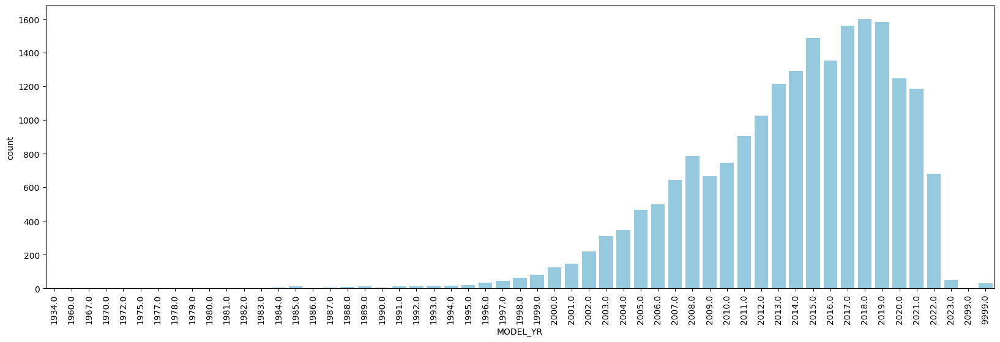

In [35]:
car_year = df.merge(vehicle[['CRN', 'MODEL_YR']], on='CRN', how='left')
print(car_year.shape)
plt.figure(figsize=(20, 6))
sns.countplot(x='MODEL_YR', data=car_year, color='skyblue')
plt.xticks(rotation=90)
plt.show()

### Weather Analysis

<Axes: xlabel='WEATHER1', ylabel='count'>

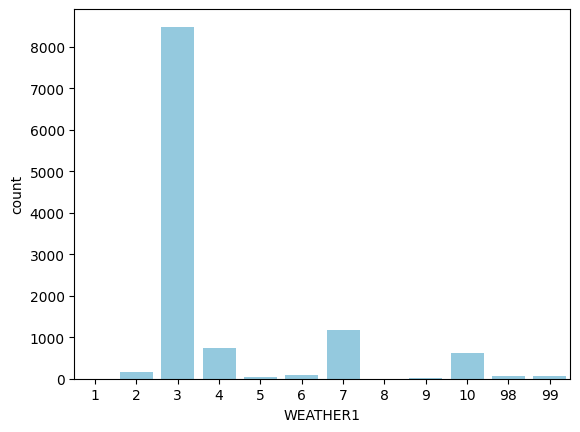

In [36]:
# 03: clear
sns.countplot(x='WEATHER1', data=df, color='skyblue')

In [37]:
clear_percent = df['WEATHER1'].value_counts(normalize=True)[3]/df['WEATHER1'].value_counts(normalize=True).sum()
print(f"Percentage of clear weather: {clear_percent:.2%}")

Percentage of clear weather: 74.14%


0 – Property Damage Only 1 – Fatal 2 – Suspected Serious Injury 3 – Suspected Minor Injury 4 – Possible Injury 8 – Injury – Unknown Severity 9 – Unknown if Injured

01 - Blowing Sand, Soil, Dirt 02 - Blowing Snow 03 - Clear 04 - Cloudy 05 - Fog, Smog, Smoke 06 - Freezing Rain or Freezing Drizzle 07 - Rain 08 - Severe Crosswinds 09 - Sleet or Hail 10 - Snow 98 - Other 99 - Unknown

WEATHER1
3     76.978940
7     10.611837
4      6.771968
10     5.637255
Name: proportion, dtype: float64


<Axes: xlabel='MAX_SEVERITY_LEVEL'>

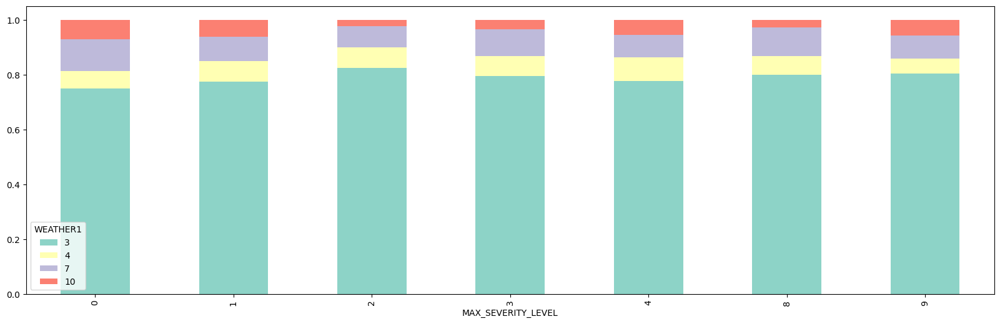

In [38]:
main_weather = df[df['WEATHER1'].isin([3, 4, 7, 10])]
weather_percentages = main_weather['WEATHER1'].value_counts(normalize=True) * 100
print(weather_percentages)

weather = main_weather.groupby('MAX_SEVERITY_LEVEL')['WEATHER1']
weather_counts = main_weather['WEATHER1'].value_counts(normalize=True)
num_unique_weather = weather_counts.size
colors = sns.color_palette("Set3", num_unique_weather).as_hex() 
weather.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

1 – Daylight 2 – Dark – no streetlights 3 – Dark – streetlights 4 – Dusk 5 – Dawn 6 – Dark – unknown roadway lighting 8 – Other 9 – Unknown

<Axes: xlabel='ILLUMINATION', ylabel='count'>

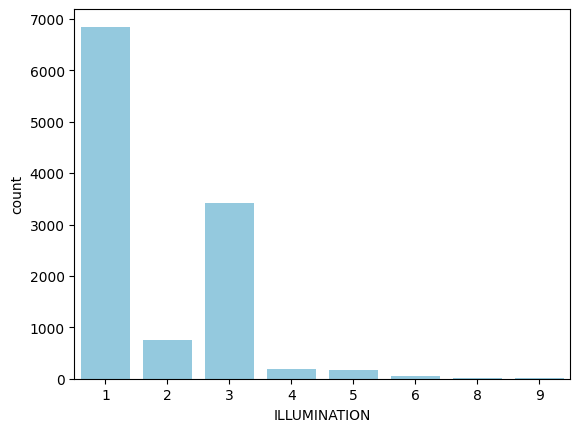

In [39]:
sns.countplot(x='ILLUMINATION', data=df, color='skyblue')

0 – Property Damage Only 1 – Fatal 2 – Suspected Serious Injury 3 – Suspected Minor Injury 4 – Possible Injury 8 – Injury – Unknown Severity 9 – Unknown if Injured

ILLUMINATION
1    62.231916
3    31.006907
2     6.761178
Name: proportion, dtype: float64


<Axes: xlabel='MAX_SEVERITY_LEVEL'>

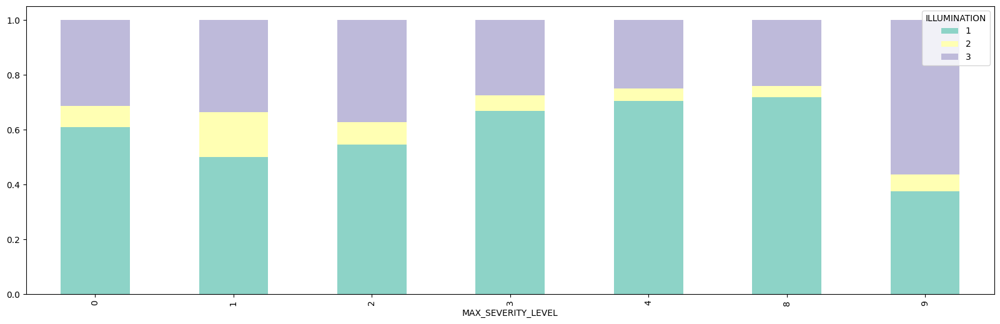

In [40]:
# 1-Daylight; 2-Dark no streetlights; 3-Dark streetlight
main_illumination = df[df['ILLUMINATION'].isin([1, 2, 3])]
illu_percentages = main_illumination['ILLUMINATION'].value_counts(normalize=True) * 100
print(illu_percentages)

illumination = main_illumination.groupby('MAX_SEVERITY_LEVEL')['ILLUMINATION']
illu_counts = main_illumination['ILLUMINATION'].value_counts(normalize=True)
num_unique_illu = illu_counts.size
colors = sns.color_palette("Set3", num_unique_illu).as_hex() 
illumination.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

### Speed Analysis

<Axes: xlabel='SPEED_LIMIT'>

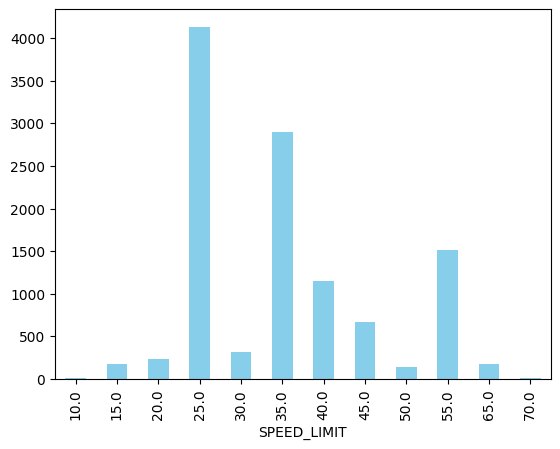

In [41]:
df.groupby('SPEED_LIMIT')['CRN'].count().plot(kind='bar', color='skyblue')

0 – Property Damage Only 1 – Fatal 2 – Suspected Serious Injury 3 – Suspected Minor Injury 4 – Possible Injury 8 – Injury – Unknown Severity 9 – Unknown if Injured

SPEED_LIMIT
25.0    39.855282
35.0    27.969127
55.0    14.635794
40.0    11.123975
45.0     6.415822
Name: proportion, dtype: float64


<Axes: xlabel='MAX_SEVERITY_LEVEL'>

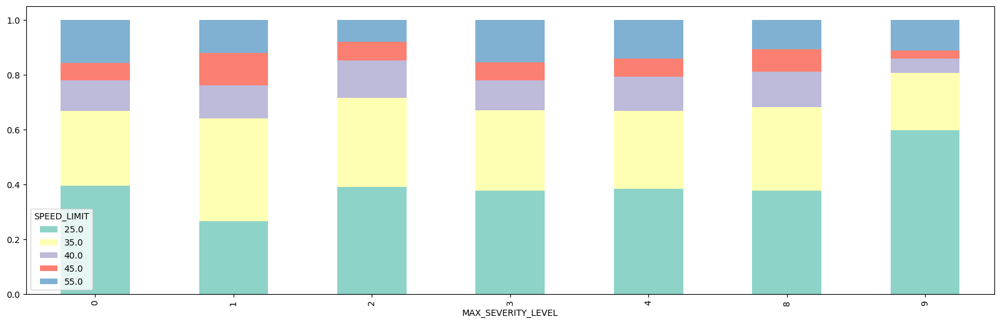

In [42]:
main_limit = df[df['SPEED_LIMIT'].isin([25, 35, 40, 45, 55])]
speed_limit_percentages = main_limit['SPEED_LIMIT'].value_counts(normalize=True) * 100
print(speed_limit_percentages)

speed = main_limit.groupby('MAX_SEVERITY_LEVEL')['SPEED_LIMIT']
speed_counts = main_limit['SPEED_LIMIT'].value_counts(normalize=True)
num_unique_speed = speed_counts.size
colors = sns.color_palette("Set3", num_unique_speed).as_hex()
speed.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

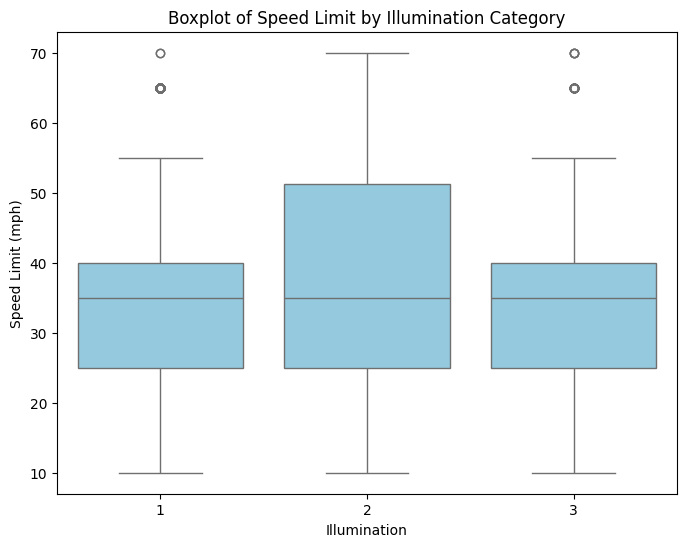

In [43]:
# 1-Daylight; 2-Dark no streetlights; 3-Dark streetlight
plt.figure(figsize=(8, 6))
sns.boxplot(x='ILLUMINATION', y='SPEED_LIMIT', data=main_illumination, color='skyblue')
plt.title('Boxplot of Speed Limit by Illumination Category')
plt.xlabel('Illumination')
plt.ylabel('Speed Limit (mph)')
plt.show()

<Axes: xlabel='SPEED_LIMIT'>

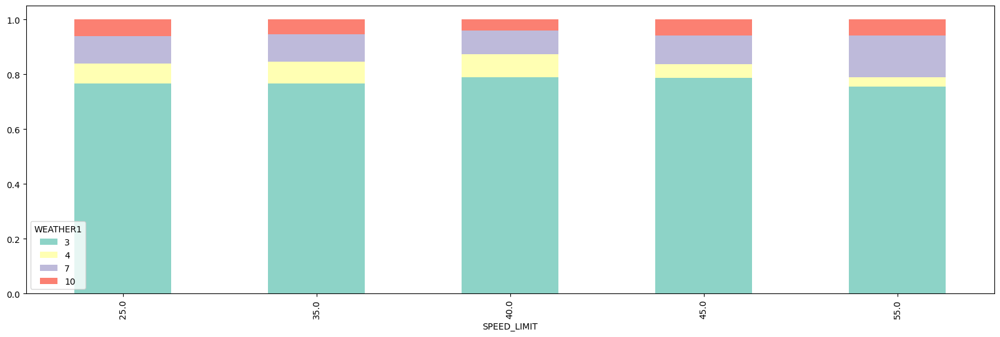

In [44]:
# 03 - Clear; 04 - Cloudy; 07 - Rain; 10 - Snow
main_speed_weather = main_limit[main_limit['WEATHER1'].isin([3, 4, 7, 10])]
data = main_speed_weather.groupby('SPEED_LIMIT')['WEATHER1']
colors = sns.color_palette("Set3", 4).as_hex()
data.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

### Age Analysis

In [45]:
age_related = df[['DRIVER_16YR', 'DRIVER_17YR', 'DRIVER_18YR', 'DRIVER_19YR', 'DRIVER_20YR', 'DRIVER_50_64YR', 'DRIVER_65_74YR', 'DRIVER_75PLUS', 'SPEEDING', 'SPEEDING_RELATED']]

In [46]:
age_groups = ['DRIVER_16YR', 'DRIVER_17YR', 'DRIVER_18YR', 'DRIVER_19YR', 'DRIVER_20YR', 'DRIVER_50_64YR', 'DRIVER_65_74YR', 'DRIVER_75PLUS']
counts = age_related[age_groups].sum().sort_values(ascending=False)
proportions = age_related[age_groups].mean().sort_values(ascending=False)

print("Counts of each feature:\n", counts)
print("\nProportions of each feature:\n", proportions)

Counts of each feature:
 DRIVER_50_64YR    3173.0
DRIVER_65_74YR    1288.0
DRIVER_75PLUS      700.0
DRIVER_20YR        432.0
DRIVER_18YR        407.0
DRIVER_19YR        390.0
DRIVER_17YR        332.0
DRIVER_16YR        137.0
dtype: float64

Proportions of each feature:
 DRIVER_50_64YR    0.277409
DRIVER_65_74YR    0.112607
DRIVER_75PLUS     0.061200
DRIVER_20YR       0.037769
DRIVER_18YR       0.035583
DRIVER_19YR       0.034097
DRIVER_17YR       0.029026
DRIVER_16YR       0.011978
dtype: float64


In [47]:
person.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253838 entries, 0 to 253837
Data columns (total 4 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   AGE                   253838 non-null  int64 
 1   CRN                   253838 non-null  int64 
 2   SEX                   253838 non-null  object
 3   VULNERABLE_ROAD_USER  253838 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 7.7+ MB


In [48]:
person['AGE'].describe()

count    253838.000000
mean         39.495564
std          21.907903
min           1.000000
25%          22.000000
50%          35.000000
75%          54.000000
max          99.000000
Name: AGE, dtype: float64

Text(0.5, 1.0, 'Age histogram')

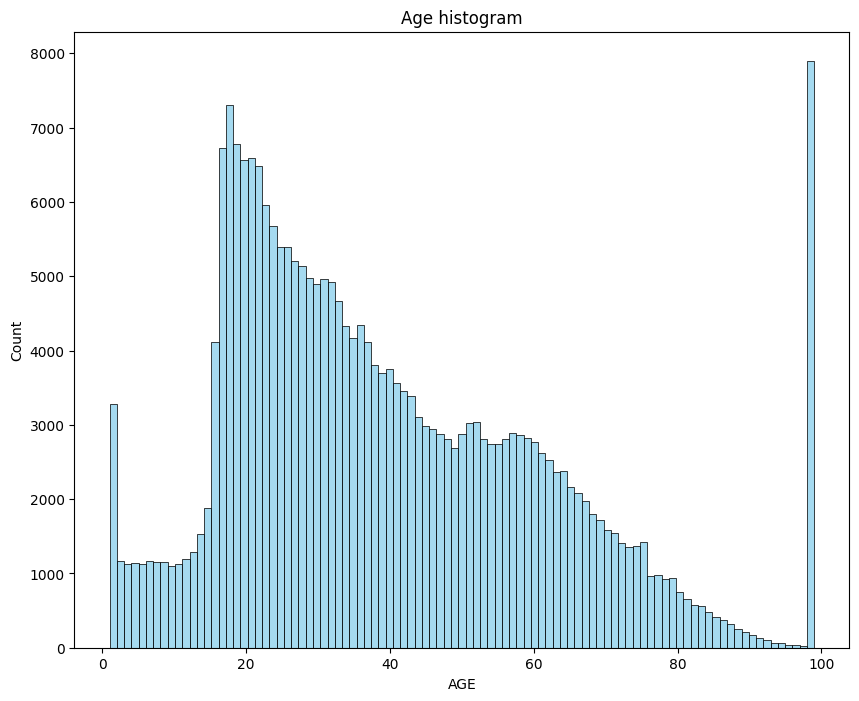

In [49]:
plt.figure(figsize=(10,8))
sns.histplot(person['AGE'], color='skyblue')
plt.title('Age histogram')

<Axes: xlabel='VULNERABLE_ROAD_USER', ylabel='count'>

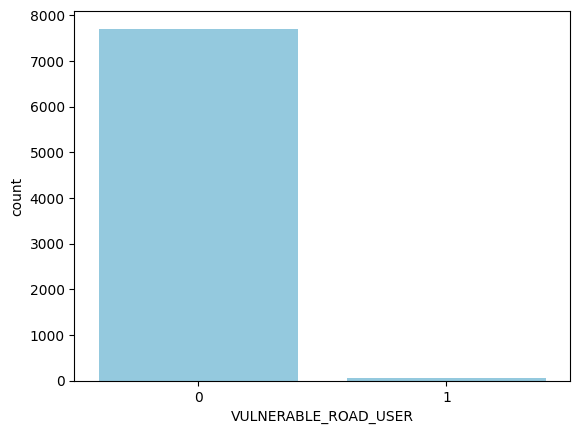

In [50]:
age_99 = person[person['AGE'] == 99]
# 1= Y, 0 = N
sns.countplot(x='VULNERABLE_ROAD_USER', data=age_99, color='skyblue')

<Axes: xlabel='SEX', ylabel='count'>

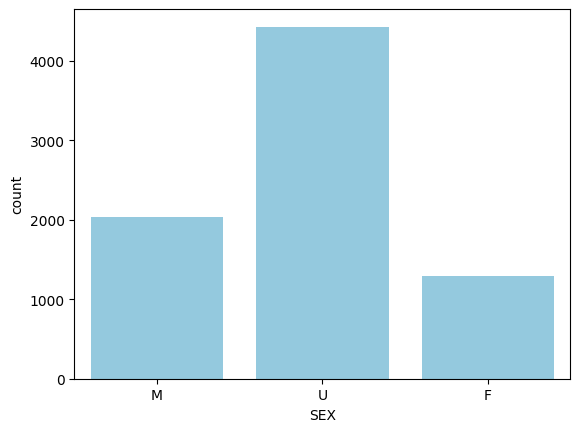

In [51]:
sns.countplot(x='SEX', data=age_99, color='skyblue')

### Road Condition Analysis

00 – Mid-block 01 – Four-way intersection 02 – “T” intersection 03 – “Y” intersection 04 – Traffic Circle/Roundabout (EXPIRED 1/1/18) 05 – Multi-leg intersection 06 – Ramp End 07 – Ramp Begin 08 – Crossover 09 – Railroad crossing 10 – Other 11 – “L” Intersection 12 – Traffic Circle 13 - Roundabout 99 – Unknown

<Axes: xlabel='INTERSECT_TYPE'>

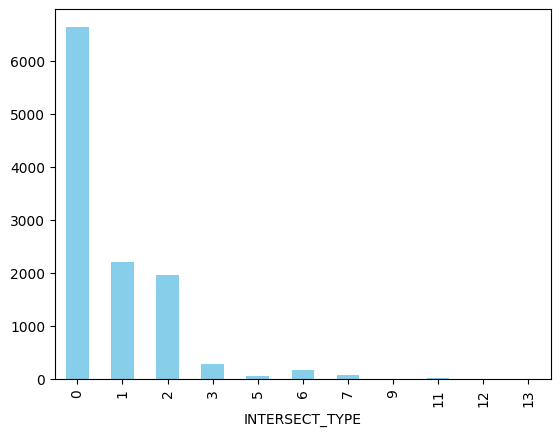

In [52]:
# 00 Mid-block 01 Four-way intersection 02 “T” intersection
df.groupby('INTERSECT_TYPE')['CRN'].count().plot(kind='bar', color='skyblue')

00 – Mid-block 01 – Four-way intersection 02 – “T” intersection 03 – “Y” intersection 04 – Traffic Circle/Roundabout (EXPIRED 1/1/18) 05 – Multi-leg intersection 06 – Ramp End 07 – Ramp Begin 08 – Crossover 09 – Railroad crossing 10 – Other 11 – “L” Intersection 12 – Traffic Circle 13 - Roundabout 99 – Unknown

INTERSECT_TYPE
0    59.040853
1    19.689165
2    17.371226
3     2.451155
6     1.447602
Name: proportion, dtype: float64


<Axes: xlabel='MAX_SEVERITY_LEVEL'>

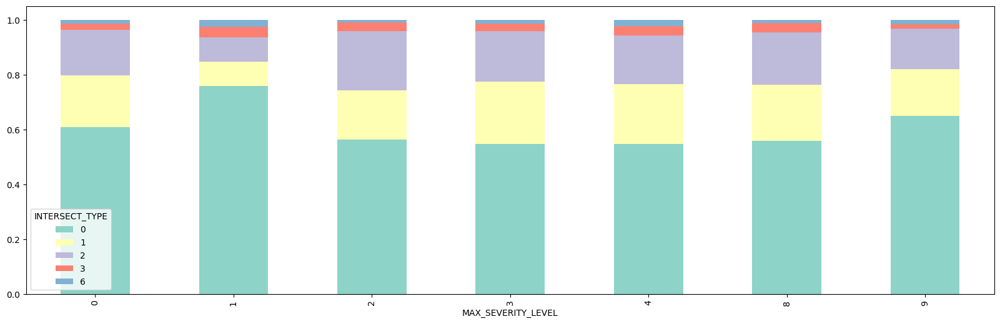

In [53]:
main_type = df[df['INTERSECT_TYPE'].isin([0, 1, 2, 3, 6])]
type_percentages = main_type['INTERSECT_TYPE'].value_counts(normalize=True) * 100
print(type_percentages)

type = main_type.groupby('MAX_SEVERITY_LEVEL')['INTERSECT_TYPE']
colors = sns.color_palette("Set3", 5).as_hex()
type.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

01 - Dry 02 - Ice/Frost 03 - Mud, Dirt, Gravel 04 - Oil 05 - Sand 06 - Slush 07 - Snow 08 - Water (Standing or Moving) 09 - Wet 22 - Mud, Sand, Dirt, Oil (Expired 1-1-20) 98 - Other 99 - Unknown

<Axes: xlabel='ROAD_CONDITION'>

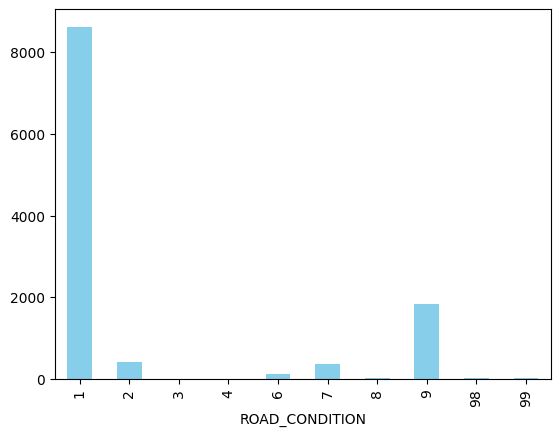

In [54]:
df.groupby('ROAD_CONDITION')['CRN'].count().plot(kind='bar', color='skyblue')

01 - Dry 02 - Ice/Frost 03 - Mud, Dirt, Gravel 04 - Oil 05 - Sand 06 - Slush 07 - Snow 08 - Water (Standing or Moving) 09 - Wet 22 - Mud, Sand, Dirt, Oil (Expired 1-1-20) 98 - Other 99 - Unknown

ROAD_CONDITION
1    76.643245
9    16.401316
2     3.717869
7     3.237570
Name: proportion, dtype: float64


<Axes: xlabel='MAX_SEVERITY_LEVEL'>

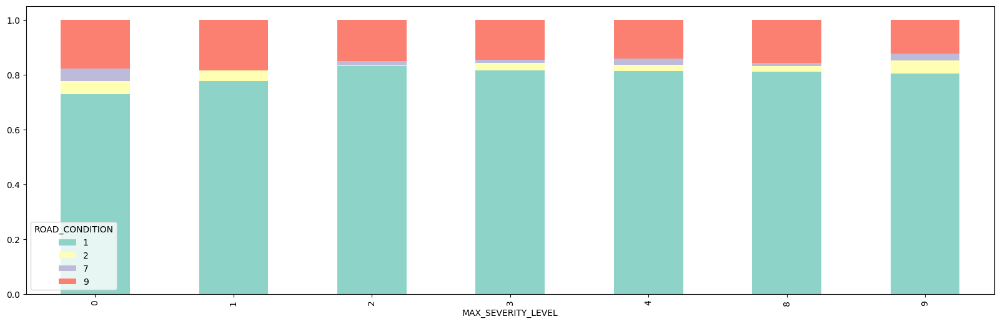

In [55]:
main_condition = df[df['ROAD_CONDITION'].isin([1, 2, 7, 9])]
condition_percentages = main_condition['ROAD_CONDITION'].value_counts(normalize=True) * 100
print(condition_percentages)

condition = main_condition.groupby('MAX_SEVERITY_LEVEL')['ROAD_CONDITION']
colors = sns.color_palette("Set3", 4).as_hex()
condition.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

RAMP_SEGMENT
0.0    0.98811
1.0    0.01189
Name: proportion, dtype: float64


<Axes: xlabel='RAMP_SEGMENT', ylabel='count'>

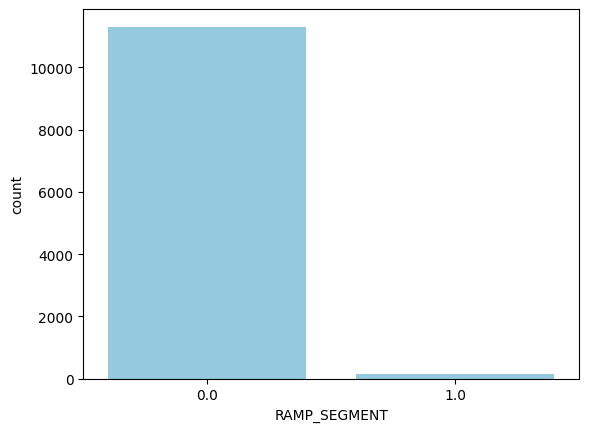

In [56]:
print(df['RAMP_SEGMENT'].value_counts(normalize=True))
sns.countplot(x='RAMP_SEGMENT', data=df, color='skyblue')

WET_ROAD
0.0    9560
1.0    1878
Name: count, dtype: int64


<Axes: xlabel='WET_ROAD', ylabel='count'>

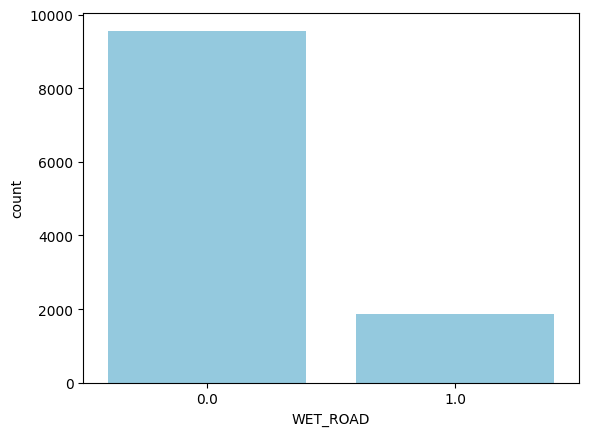

In [57]:
print(df['WET_ROAD'].value_counts(normalize=False))
sns.countplot(x='WET_ROAD', data=df, color='skyblue')

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

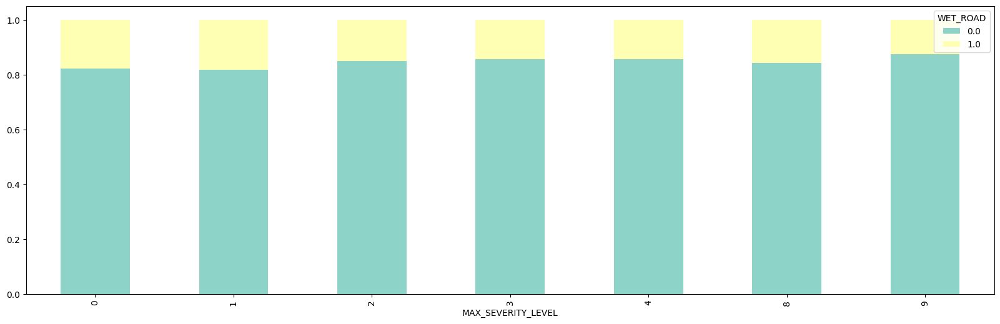

In [58]:
wet = df.groupby('MAX_SEVERITY_LEVEL')['WET_ROAD']
colors = sns.color_palette("Set3", 2).as_hex()
wet.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

RUNNING_STOP_SIGN
0.0    11255
1.0      183
Name: count, dtype: int64


<Axes: xlabel='RUNNING_STOP_SIGN', ylabel='count'>

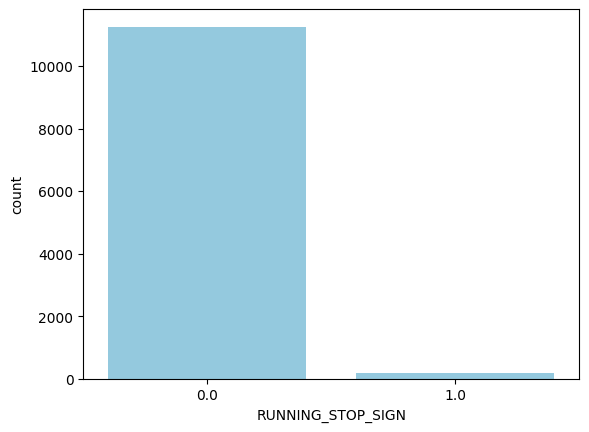

In [59]:
print(df['RUNNING_STOP_SIGN'].value_counts(normalize=False))
sns.countplot(x='RUNNING_STOP_SIGN', data=df, color='skyblue')

In [61]:
intersect_injury = df.groupby('INTERSECT_TYPE')['INJURY_COUNT'].sum()
print(intersect_injury)

INTERSECT_TYPE
0     3127
1     1240
2     1068
3      173
5       41
6       80
7       41
9        2
11      17
12       1
13       0
Name: INJURY_COUNT, dtype: int64


<Axes: xlabel='INTERSECT_TYPE'>

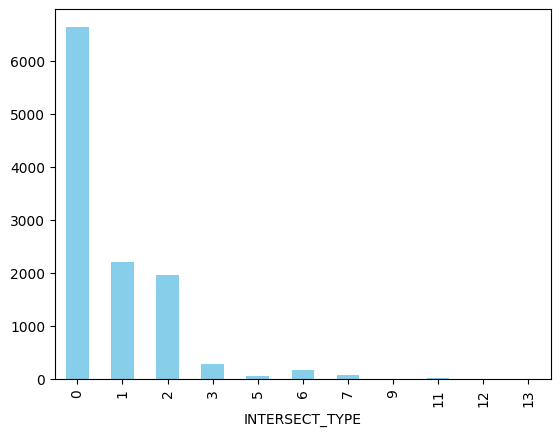

In [63]:
df.groupby('INTERSECT_TYPE')['CRN'].count().plot(kind='bar', color='skyblue')

00 – Mid-block 01 – Four-way intersection 02 – “T” intersection 03 – “Y” intersection 05 – Multi-leg intersection 06 – Ramp End 07 – Ramp Begin

INTERSECT_TYPE
0    58.285113
1    19.437138
2    17.148869
3     2.419779
6     1.429072
7     0.736454
5     0.543574
Name: proportion, dtype: float64


<Axes: xlabel='MAX_SEVERITY_LEVEL'>

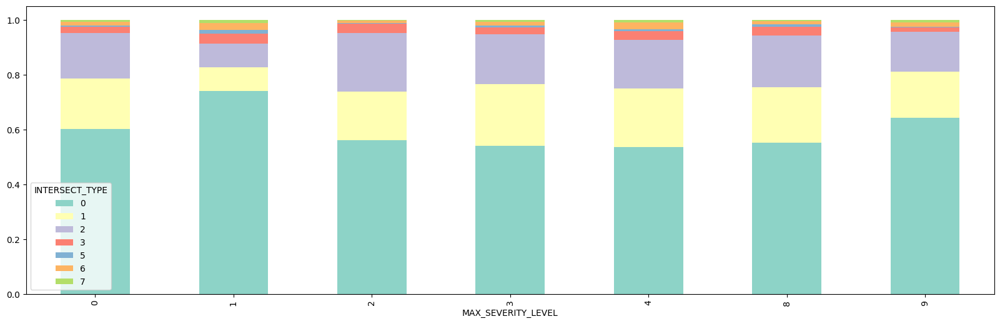

In [66]:
main_intersect = df[df['INTERSECT_TYPE'].isin([0, 1, 2, 3, 5, 6, 7])]
intersect_percentages = main_intersect['INTERSECT_TYPE'].value_counts(normalize=True) * 100
print(intersect_percentages)

intersect = main_intersect.groupby('MAX_SEVERITY_LEVEL')['INTERSECT_TYPE']
colors = sns.color_palette("Set3", 7).as_hex()
intersect.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

In [72]:
def stack_plot(feature, range):
    main = df[df[feature].isin(range)]
    percentages = main[feature].value_counts(normalize=True) * 100
    print(percentages)
    main_severity = main.groupby('MAX_SEVERITY_LEVEL')[feature]
    colors = sns.color_palette("Set3", len(range)).as_hex()
    main_severity.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='LANE_CLOSED'>

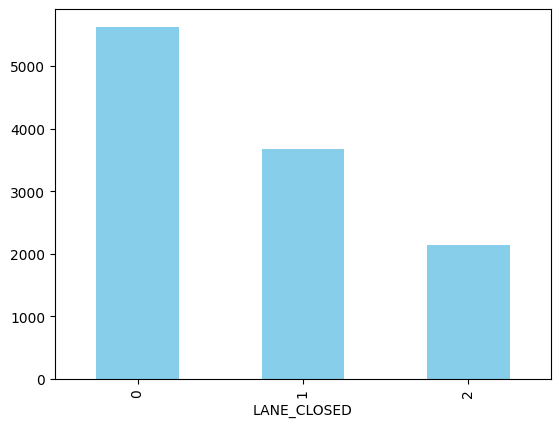

In [68]:
df.groupby('LANE_CLOSED')['CRN'].count().plot(kind='bar', color='skyblue')

LANE_CLOSED
0    60.539901
1    39.460099
Name: proportion, dtype: float64


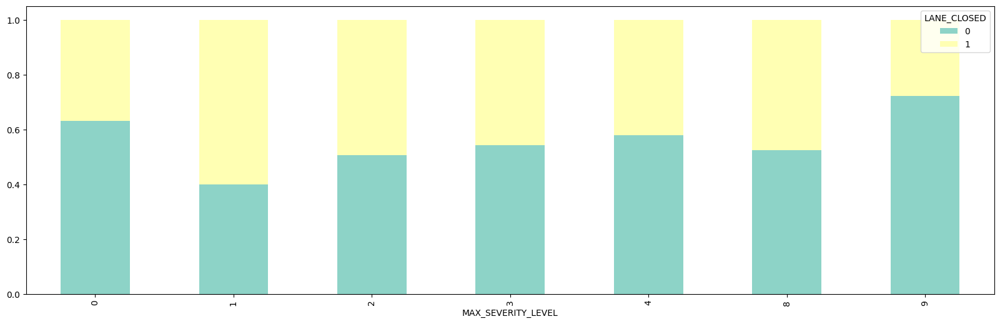

In [73]:
stack_plot('LANE_CLOSED', [0, 1])

<Axes: xlabel='RELATION_TO_ROAD'>

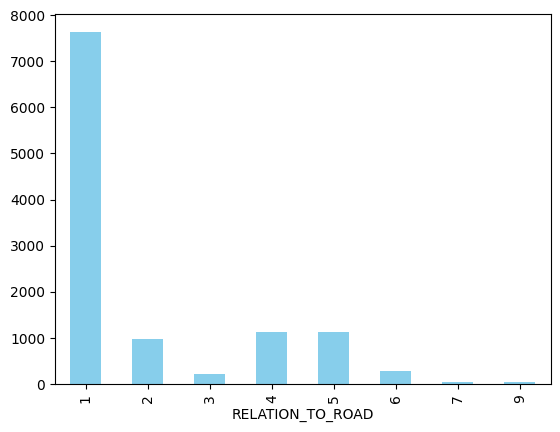

In [74]:
df.groupby('RELATION_TO_ROAD')['CRN'].count().plot(kind='bar', color='skyblue')

1 – On roadway 2 – Shoulder 3 – Median 4 – Roadside (off trafficway; on vehicle area) 5 – Outside trafficway (in area not meant for vehicles) 6 – In parking lane

RELATION_TO_ROAD
1    67.232882
4     9.936631
5     9.883823
2     8.607640
6     2.534765
3     1.804260
Name: proportion, dtype: float64


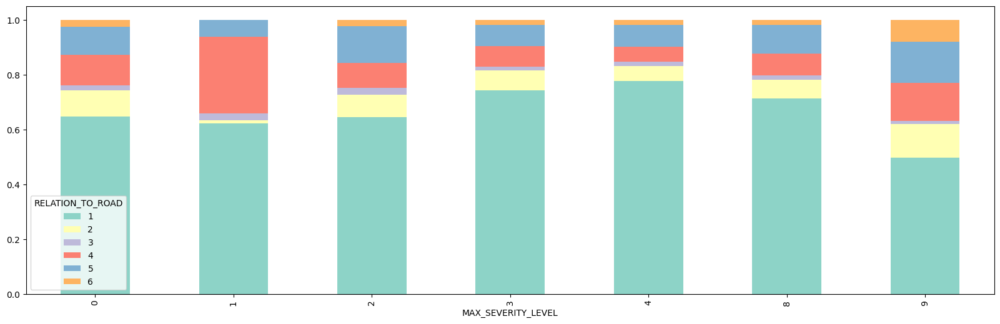

In [75]:
stack_plot('RELATION_TO_ROAD', [1, 2, 3, 4, 5, 6])

In [76]:
road_injury = df.groupby('RELATION_TO_ROAD')['INJURY_COUNT'].sum()
print(road_injury)

RELATION_TO_ROAD
1    4389
2     348
3      81
4     394
5     451
6      90
7      22
9      15
Name: INJURY_COUNT, dtype: int64


<Axes: xlabel='CURVED_ROAD'>

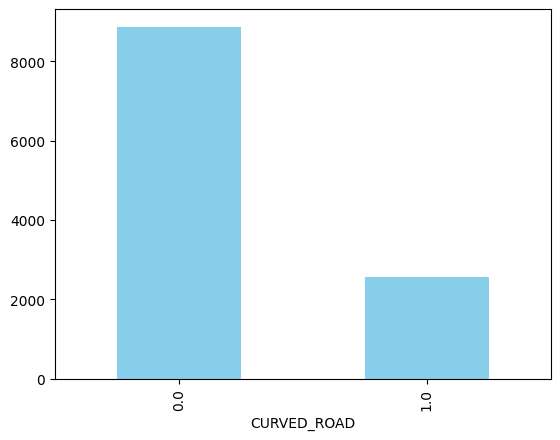

In [88]:
df.groupby('CURVED_ROAD')['CRN'].count().plot(kind='bar', color='skyblue')

CURVED_ROAD
0.0    77.600979
1.0    22.399021
Name: proportion, dtype: float64


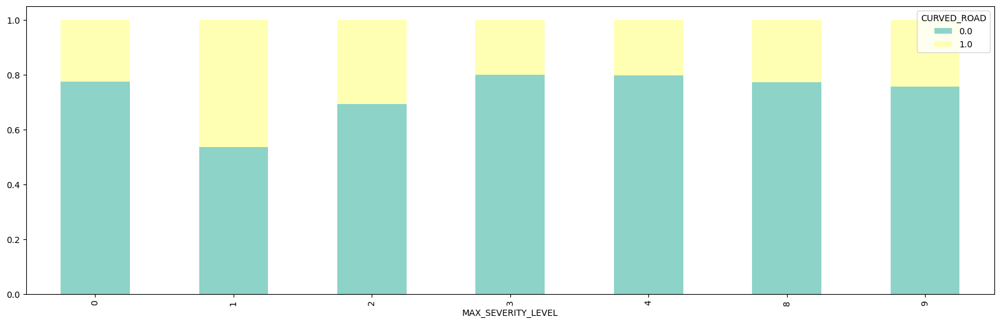

In [89]:
stack_plot('CURVED_ROAD', [0, 1])

<Axes: xlabel='LANE_DEPARTURE'>

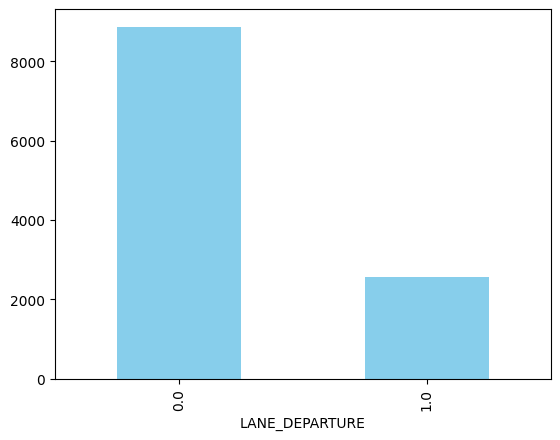

In [96]:
df.groupby('LANE_DEPARTURE')['CRN'].count().plot(kind='bar', color='skyblue')

LANE_DEPARTURE
0.0    77.557265
1.0    22.442735
Name: proportion, dtype: float64


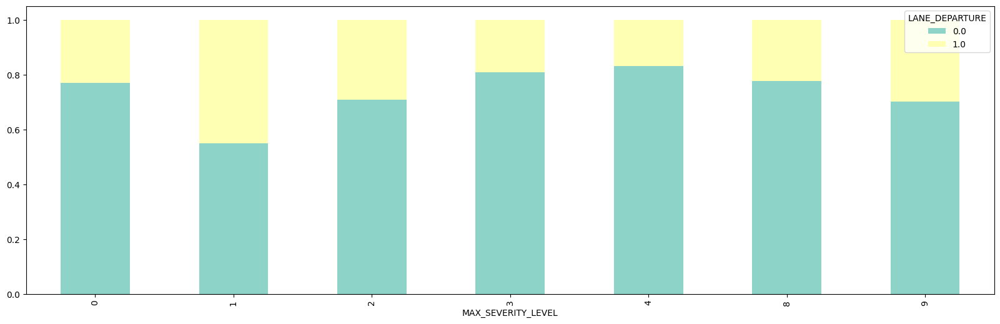

In [97]:
stack_plot('LANE_DEPARTURE', [0, 1])

In [98]:
intersection_injury = df.groupby('LANE_DEPARTURE')['INJURY_COUNT'].sum()
print(intersection_injury)

LANE_DEPARTURE
0.0    4608
1.0    1182
Name: INJURY_COUNT, dtype: int64


<Axes: xlabel='REAR_END'>

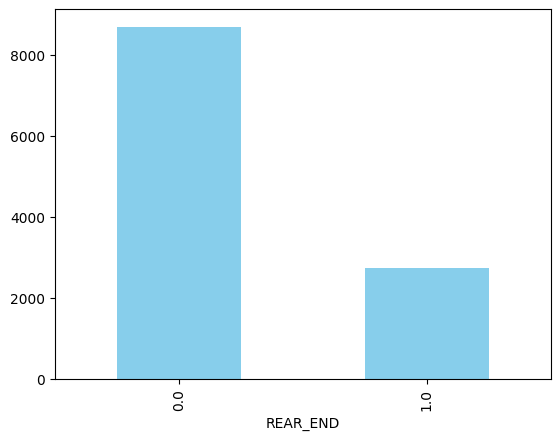

In [101]:
df.groupby('REAR_END')['CRN'].count().plot(kind='bar', color='skyblue')

REAR_END
0.0    76.079734
1.0    23.920266
Name: proportion, dtype: float64


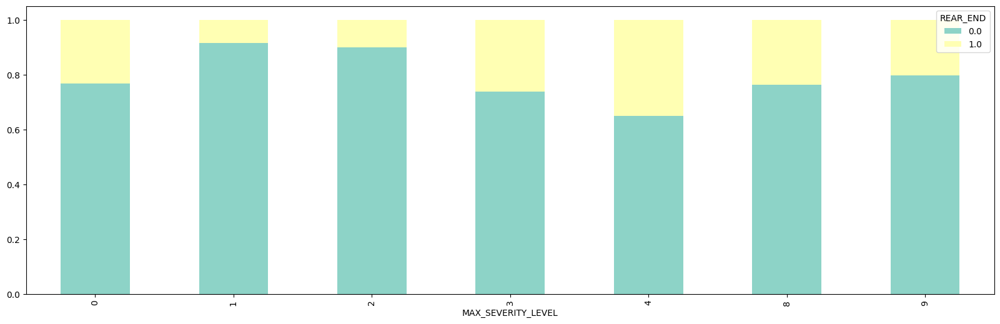

In [102]:
stack_plot('REAR_END', [0, 1])

### Behavior Analysis

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

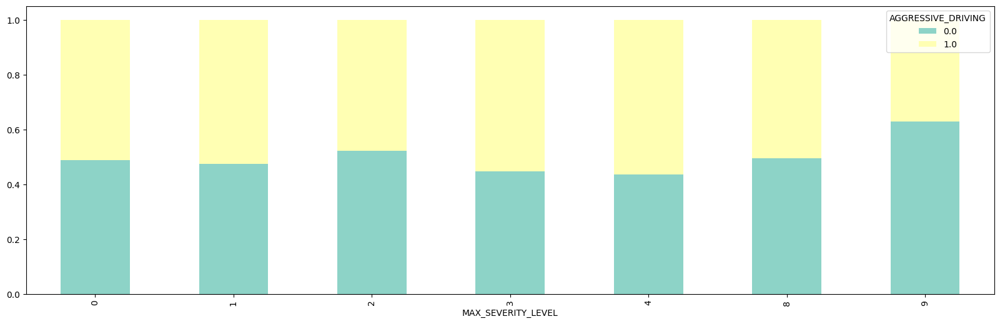

In [ ]:
aggressive = df.groupby('MAX_SEVERITY_LEVEL')['AGGRESSIVE_DRIVING']
colors = sns.color_palette("Set3", 2).as_hex()
aggressive.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

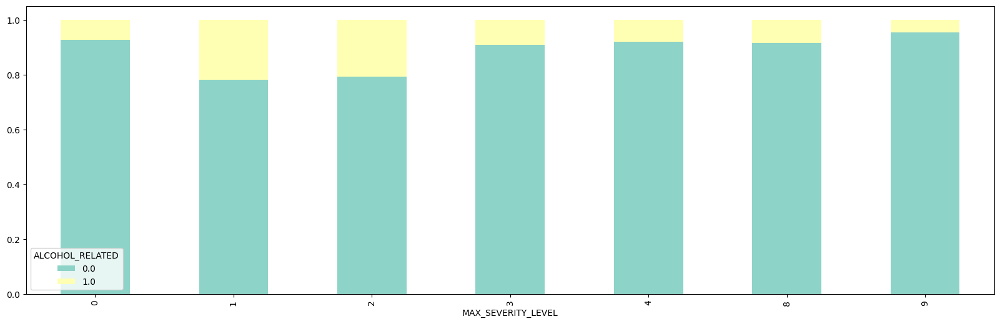

In [ ]:
alcohol = df.groupby('MAX_SEVERITY_LEVEL')['ALCOHOL_RELATED']
colors = sns.color_palette("Set3", 2).as_hex()
alcohol.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

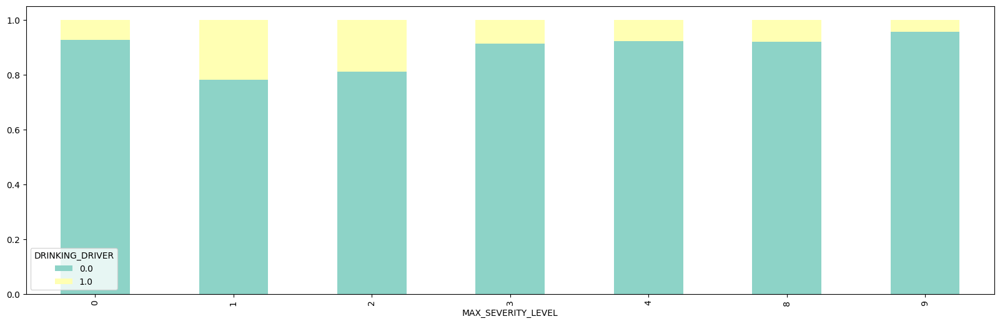

In [ ]:
drinking_driver = df.groupby('MAX_SEVERITY_LEVEL')['DRINKING_DRIVER']
colors = sns.color_palette("Set3", 2).as_hex()
drinking_driver.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

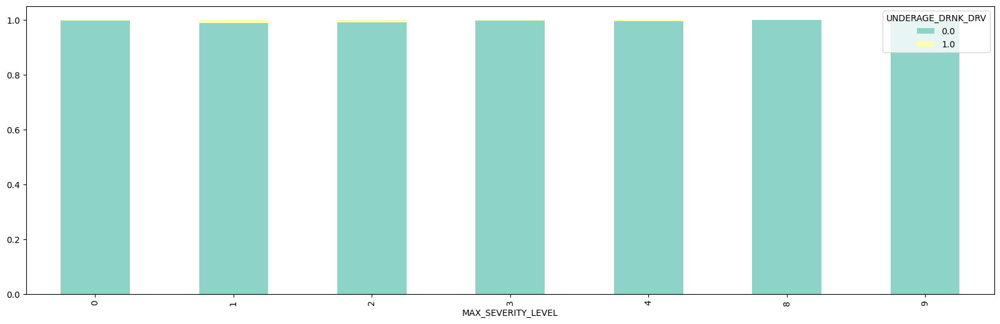

In [ ]:
underage_drinking_driver = df.groupby('MAX_SEVERITY_LEVEL')['UNDERAGE_DRNK_DRV']
colors = sns.color_palette("Set3", 2).as_hex()
underage_drinking_driver.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

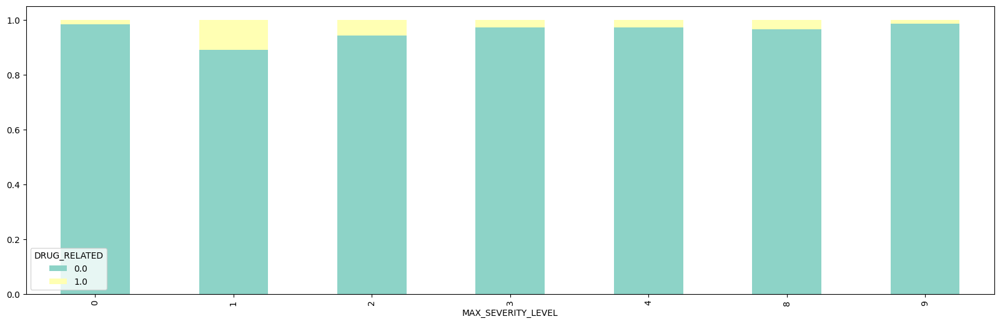

In [ ]:
drug = df.groupby('MAX_SEVERITY_LEVEL')['DRUG_RELATED']
colors = sns.color_palette("Set3", 2).as_hex()
drug.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

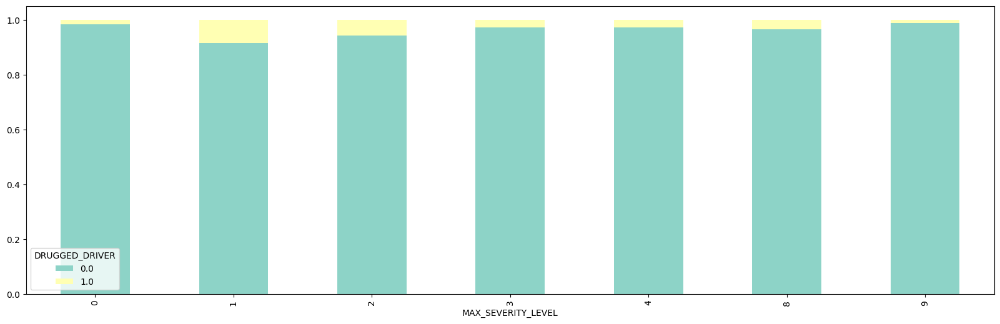

In [ ]:
drugged_driver = df.groupby('MAX_SEVERITY_LEVEL')['DRUGGED_DRIVER']
colors = sns.color_palette("Set3", 2).as_hex()
drugged_driver.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

MAX_SEVERITY_LEVEL  MARIJUANA_RELATED
0                   0.0                  6410
                    1.0                     3
1                   0.0                    81
                    1.0                     1
2                   0.0                   338
                    1.0                     1
3                   0.0                  2202
                    1.0                     2
4                   0.0                   762
                    1.0                     1
8                   0.0                  1049
                    1.0                     3
9                   0.0                   585
Name: count, dtype: int64


<Axes: xlabel='MAX_SEVERITY_LEVEL'>

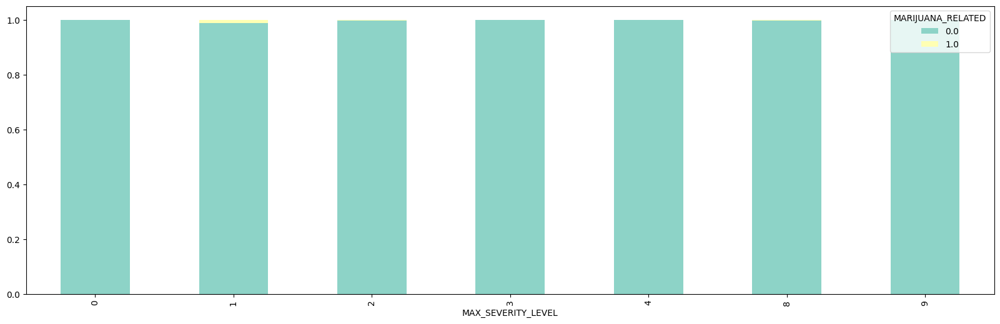

In [ ]:
marijuana = df.groupby('MAX_SEVERITY_LEVEL')['MARIJUANA_RELATED']
print(marijuana.value_counts(normalize=False))
colors = sns.color_palette("Set3", 2).as_hex()
marijuana.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

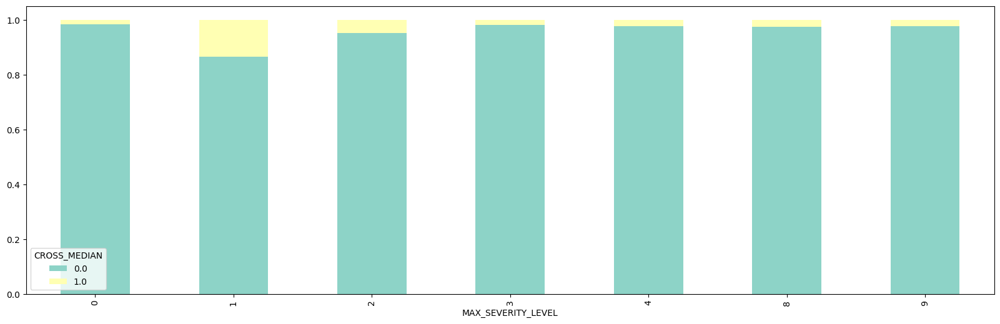

In [ ]:
cross_median = df.groupby('MAX_SEVERITY_LEVEL')['CROSS_MEDIAN']
colors = sns.color_palette("Set3", 2).as_hex()
cross_median.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

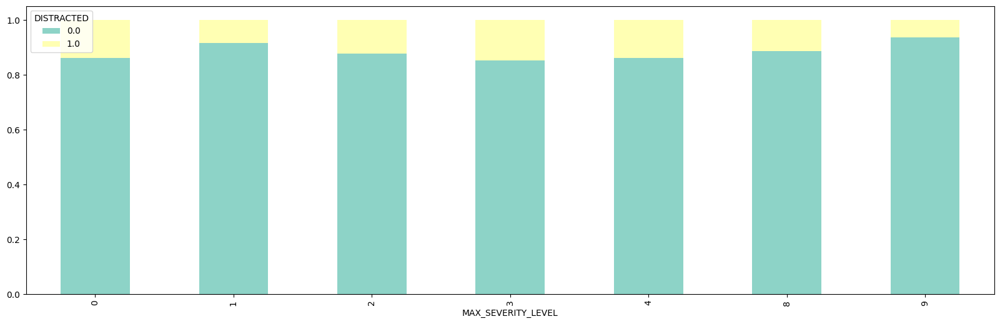

In [ ]:
distracted = df.groupby('MAX_SEVERITY_LEVEL')['DISTRACTED']
colors = sns.color_palette("Set3", 2).as_hex()
distracted.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

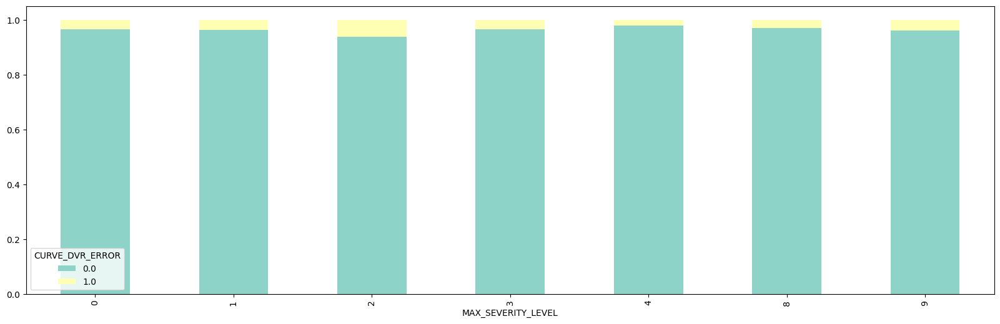

In [ ]:
curve = df.groupby('MAX_SEVERITY_LEVEL')['CURVE_DVR_ERROR']
colors = sns.color_palette("Set3", 2).as_hex()
curve.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

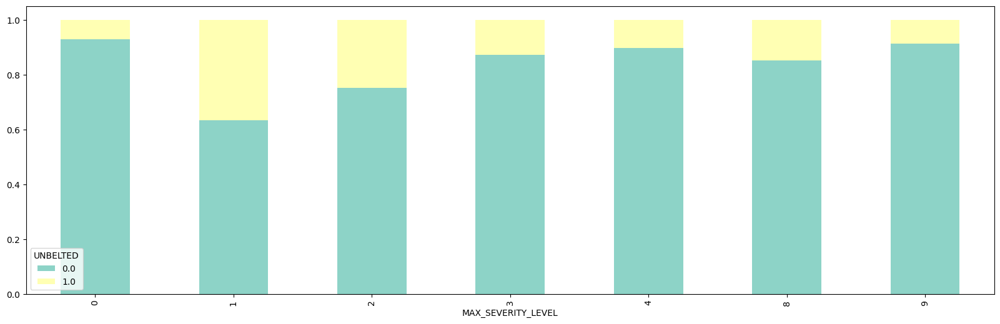

In [ ]:
belt = df.groupby('MAX_SEVERITY_LEVEL')['UNBELTED']
colors = sns.color_palette("Set3", 2).as_hex()
belt.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

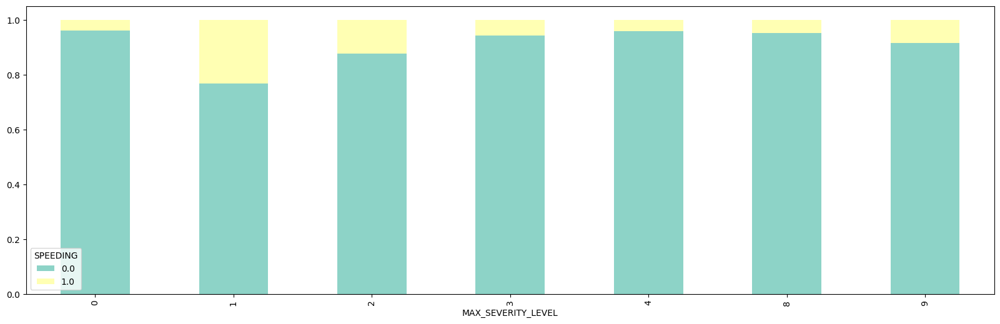

In [106]:
speeding = df.groupby('MAX_SEVERITY_LEVEL')['SPEEDING']
colors = sns.color_palette("Set3", 2).as_hex()
speeding.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

<Axes: xlabel='MAX_SEVERITY_LEVEL'>

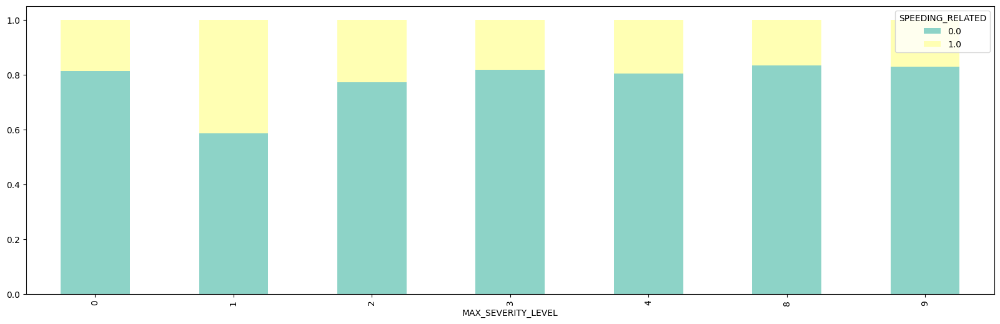

In [107]:
speeding_related = df.groupby('MAX_SEVERITY_LEVEL')['SPEEDING_RELATED']
colors = sns.color_palette("Set3", 2).as_hex()
speeding_related.value_counts(normalize=True).unstack().plot(kind='bar', stacked=True, color=colors, figsize=(20, 6))

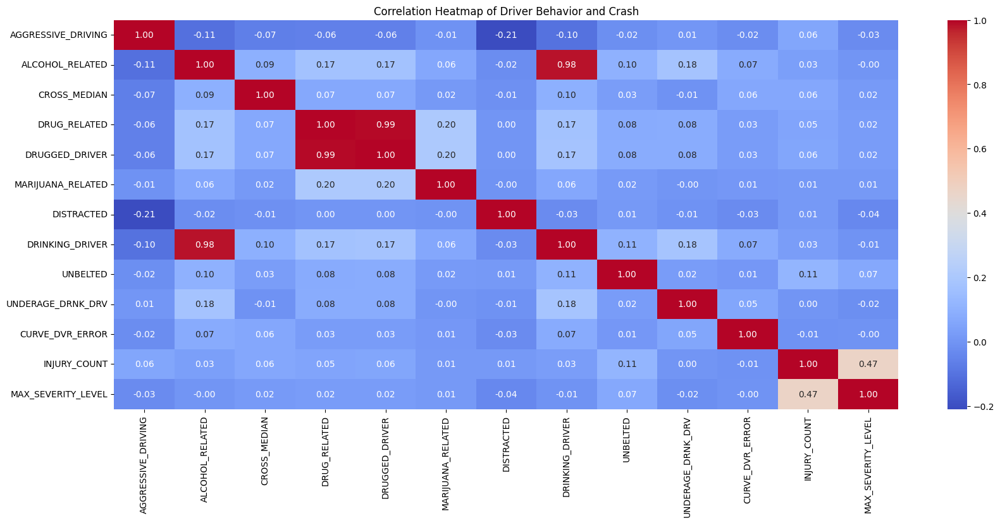

In [ ]:
behavior_crash = ['AGGRESSIVE_DRIVING', 'ALCOHOL_RELATED', 'CROSS_MEDIAN', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'MARIJUANA_RELATED',
                   'DISTRACTED', 'DRINKING_DRIVER', 'UNBELTED', 'UNDERAGE_DRNK_DRV', 'CURVE_DVR_ERROR', 'INJURY_COUNT', 'MAX_SEVERITY_LEVEL']
correlation_matrix = df[behavior_crash].corr()
plt.figure(figsize=(20, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Driver Behavior and Crash')
plt.show()

ALCOHOL_RELATED, DRINKING_DRIVER, DRUG_RELATED, DRUGGED_DRIVER, CROSS_MEDIAN

### Crash Information Analysis

In [ ]:
binary_columns = ['BELTED_DEATH_COUNT', 'BELTED_SUSP_SERIOUS_INJ_COUNT', 'FATAL_COUNT', 'INJURY_COUNT', 'MAX_SEVERITY_LEVEL', 'MCYCLE_DEATH_COUNT', 'MCYCLE_SUSP_SERIOUS_INJ_COUNT', 'MOTORCYCLE_COUNT', 'NONMOTR_COUNT',
           'NONMOTR_DEATH_COUNT',  'NONMOTR_SUSP_SERIOUS_INJ_COUNT', 'PED_COUNT', 'PED_DEATH_COUNT', 'PED_SUSP_SERIOUS_INJ_COUNT', 'PERSON_COUNT', 'POSSIBLE_INJ_COUNT', 'SECONDARY_CRASH', 'SUSP_MINOR_INJ_COUNT', 
           'SUSP_SERIOUS_INJ_COUNT', 'TOT_INJ_COUNT', 'TOTAL_UNITS', 'UNB_DEATH_COUNT', 'UNB_SUSP_SERIOUS_INJ_COUNT', 'UNBELTED_OCC_COUNT', 'UNK_INJ_DEG_COUNT', 'UNK_INJ_PER_COUNT', 'ANGLE_CRASH', 'BICYCLE', 'VULNERABLE_ROAD_USER_FATAL']

binary_df = df[binary_columns]

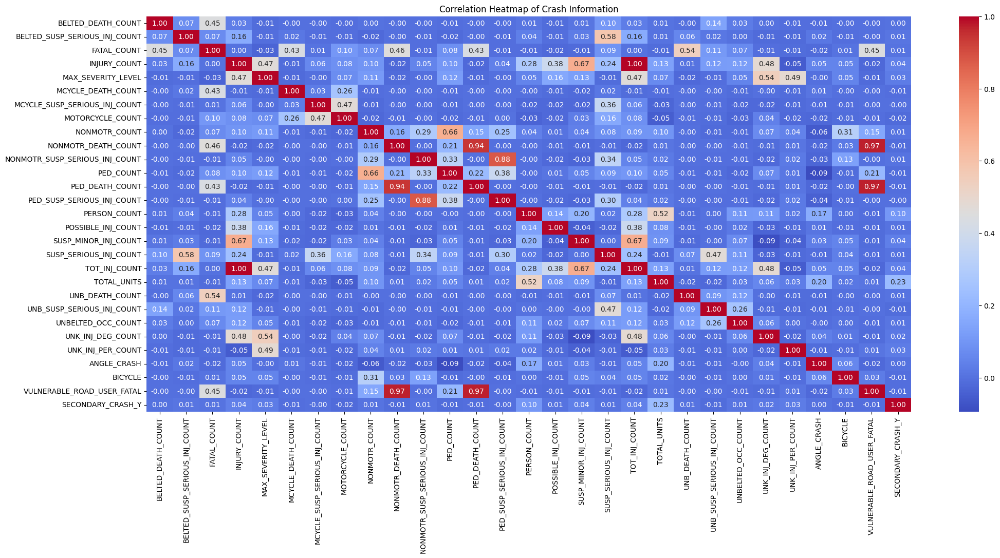

In [ ]:
binary_df = pd.get_dummies(binary_df, columns=['SECONDARY_CRASH'], drop_first=True)
correlation_matrix = binary_df.corr()

plt.figure(figsize=(24, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Crash Information')
plt.show()

### Correlation Analysis

In [ ]:
# Crash information
crash_columns = ['BELTED_DEATH_COUNT', 'BELTED_SUSP_SERIOUS_INJ_COUNT', 'FATAL_COUNT', 'INJURY_COUNT',
                 'MAX_SEVERITY_LEVEL', 'MCYCLE_DEATH_COUNT', 'MCYCLE_SUSP_SERIOUS_INJ_COUNT',
                 'MOTORCYCLE_COUNT', 'NONMOTR_COUNT', 'NONMOTR_DEATH_COUNT',
                 'NONMOTR_SUSP_SERIOUS_INJ_COUNT', 'PED_COUNT', 'PED_DEATH_COUNT',
                 'PED_SUSP_SERIOUS_INJ_COUNT', 'PERSON_COUNT', 'POSSIBLE_INJ_COUNT',
                 'SECONDARY_CRASH', 'SUSP_MINOR_INJ_COUNT', 'SUSP_SERIOUS_INJ_COUNT',
                 'TOT_INJ_COUNT', 'TOTAL_UNITS', 'UNB_DEATH_COUNT', 'UNB_SUSP_SERIOUS_INJ_COUNT',
                 'UNBELTED_OCC_COUNT', 'UNK_INJ_DEG_COUNT', 'UNK_INJ_PER_COUNT', 'ANGLE_CRASH',
                 'BICYCLE', 'VULNERABLE_ROAD_USER_FATAL']

# Time
time_columns = ['CRASH_MONTH', 'CRASH_YEAR', 'DAY_OF_WEEK', 'HOUR_OF_DAY']

# Driving Environment
driving_environment = ['WEATHER1', 'ILLUMINATION', 'ILLUMINATION_DARK']

# Builtin environment
builtin_environment = {'road_condition': ['INTERSECT_TYPE', 'LANE_CLOSED', 'RELATION_TO_ROAD', 'ROAD_CONDITION',
                                          'WORK_ZONE_IND', 'CURVED_ROAD', 'DEER_RELATED', 'ICY_ROAD', 'INTERSECTION', 'INTERSTATE',
                                          'LANE_DEPARTURE', 'LEFT_TURN', 'RAMP', 'RAMP_SEGMENT', 'REAR_END', 'ROUNDABOUT', 
                                          'RUNNING_RED_LT', 'RUNNING_STOP_SIGN', 'WET_ROAD', 'WORK_ZONE'],
                       'traffic': ['BACKUP_NONRECURRING', 'BACKUP_CONGESTION'],
                       'speed': ['LIMIT_65MPH', 'LIMIT_70MPH', 'SPEED_LIMIT', 'SPEEDING', 'SPEEDING_RELATED']
                        }

# Driver Behavior
driver_behavior = ['AGGRESSIVE_DRIVING', 'ALCOHOL_RELATED', 'CROSS_MEDIAN', 'DRUG_RELATED',
                    'DRUGGED_DRIVER', 'MARIJUANA_RELATED', 'DISTRACTED', 'DRINKING_DRIVER',
                    'UNBELTED', 'UNDERAGE_DRNK_DRV', 'CURVE_DVR_ERROR']

# Socialeconomic
socialeconomic = {'geo': ['COUNTY', 'DEC_LAT', 'DEC_LONG', 'URBAN_AREA', 'URBAN_RURAL', 'LOCATION_TYPE', 'MUNICIPALITY'],
                  'age': ['DRIVER_16YR', 'DRIVER_17YR', 'DRIVER_18YR', 'DRIVER_19YR', 'DRIVER_20YR', 'DRIVER_50_64YR', 
                          'DRIVER_65_74YR', 'DRIVER_75PLUS', 'YOUNG_DRIVER']
                  }

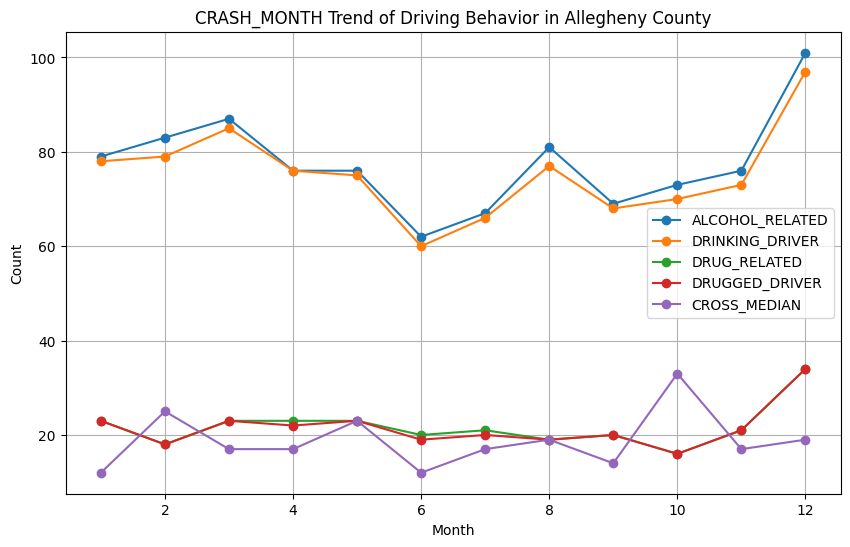

In [ ]:
month_data = df[['CRASH_MONTH', 'ALCOHOL_RELATED', 'DRINKING_DRIVER', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'CROSS_MEDIAN']]

time_series_data = month_data.groupby('CRASH_MONTH').sum()

plt.figure(figsize=(10, 6))
for column in time_series_data.columns:
    plt.plot(time_series_data.index, time_series_data[column], marker='o', label=column)
plt.title('CRASH_MONTH Trend of Driving Behavior in Allegheny County')
plt.xlabel('Month')
plt.ylabel('Count')
plt.legend()
plt.grid(True)
plt.show()

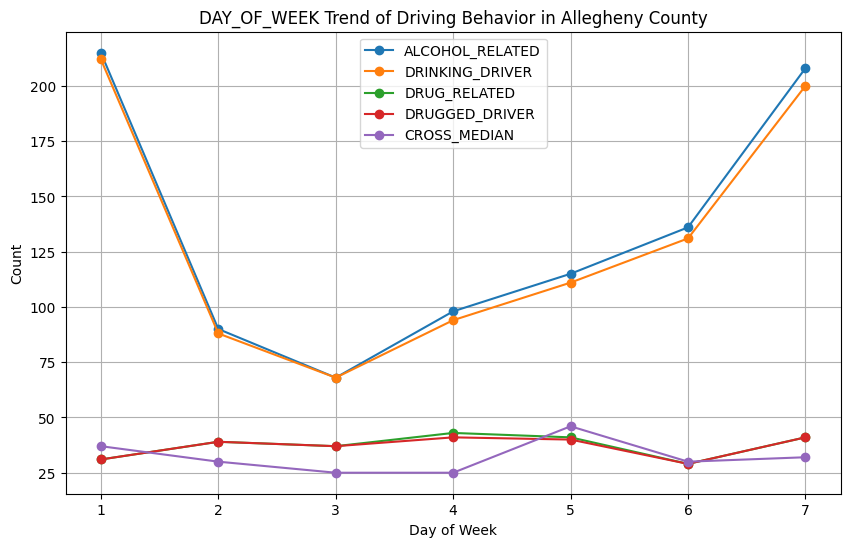

In [ ]:
dow_data = df[['DAY_OF_WEEK', 'ALCOHOL_RELATED', 'DRINKING_DRIVER', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'CROSS_MEDIAN']]

time_series_data = dow_data.groupby('DAY_OF_WEEK').sum()

plt.figure(figsize=(10, 6))
for column in time_series_data.columns:
    plt.plot(time_series_data.index, time_series_data[column], marker='o', label=column)
plt.title('DAY_OF_WEEK Trend of Driving Behavior in Allegheny County')
plt.xlabel('Day of Week')
plt.ylabel('Count')
plt.legend()
plt.grid(True)
plt.show()

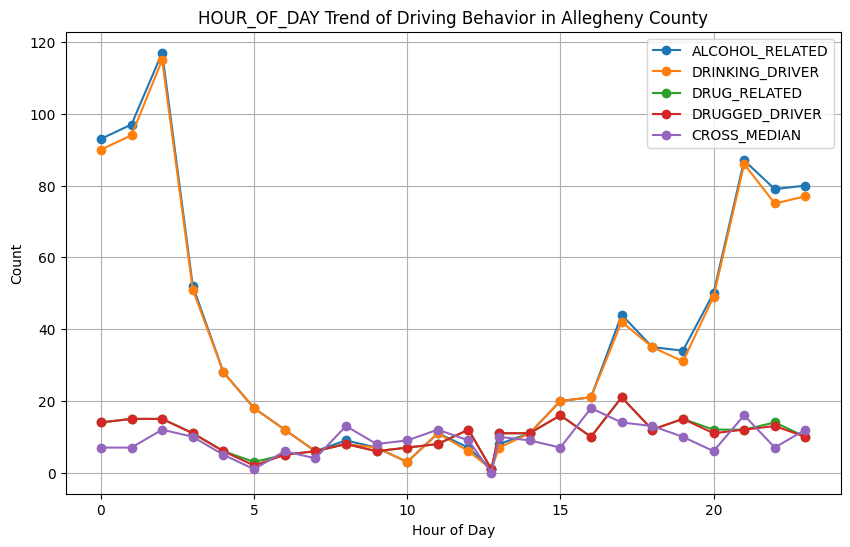

In [ ]:
hod_data = df[['HOUR_OF_DAY', 'ALCOHOL_RELATED', 'DRINKING_DRIVER', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'CROSS_MEDIAN']]

hod_data['HOUR_OF_DAY'] = hod_data['HOUR_OF_DAY']
time_series_data = hod_data.groupby('HOUR_OF_DAY').sum()

plt.figure(figsize=(10, 6))
for column in time_series_data.columns:
    plt.plot(time_series_data.index, time_series_data[column], marker='o', label=column)
plt.title('HOUR_OF_DAY Trend of Driving Behavior in Allegheny County')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.legend()
plt.grid(True)
plt.show()

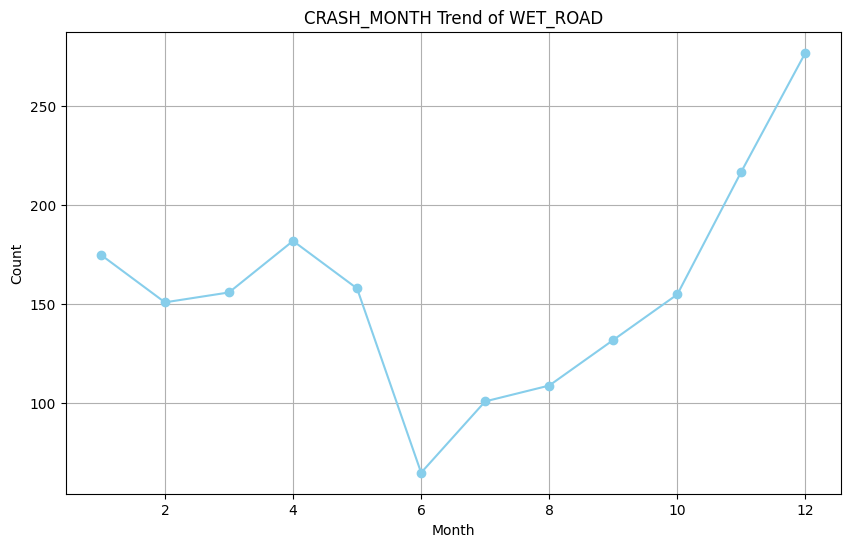

In [ ]:
time_series_data = df[['CRASH_MONTH', 'WET_ROAD']]
time_series_data = time_series_data.groupby('CRASH_MONTH')['WET_ROAD'].sum()

plt.figure(figsize=(10, 6))
time_series_data.plot(marker='o', color='skyblue', linestyle='-')
plt.title('CRASH_MONTH Trend of WET_ROAD')
plt.xlabel('Month')
plt.ylabel('Count')
plt.grid(True)
plt.show()


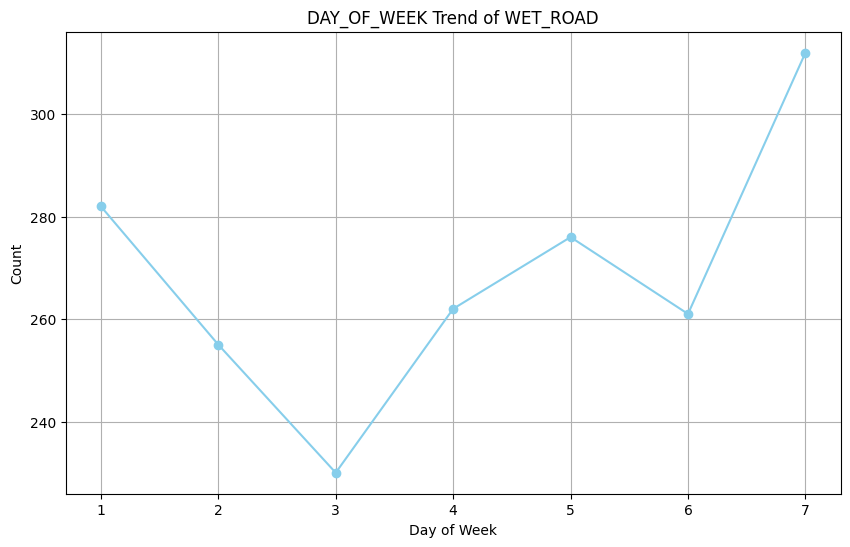

In [ ]:
time_series_data = df[['DAY_OF_WEEK', 'WET_ROAD']]
time_series_data = time_series_data.groupby('DAY_OF_WEEK')['WET_ROAD'].sum()

plt.figure(figsize=(10, 6))
time_series_data.plot(marker='o', color='skyblue', linestyle='-')
plt.title('DAY_OF_WEEK Trend of WET_ROAD')
plt.xlabel('Day of Week')
plt.ylabel('Count')
plt.grid(True)
plt.show()

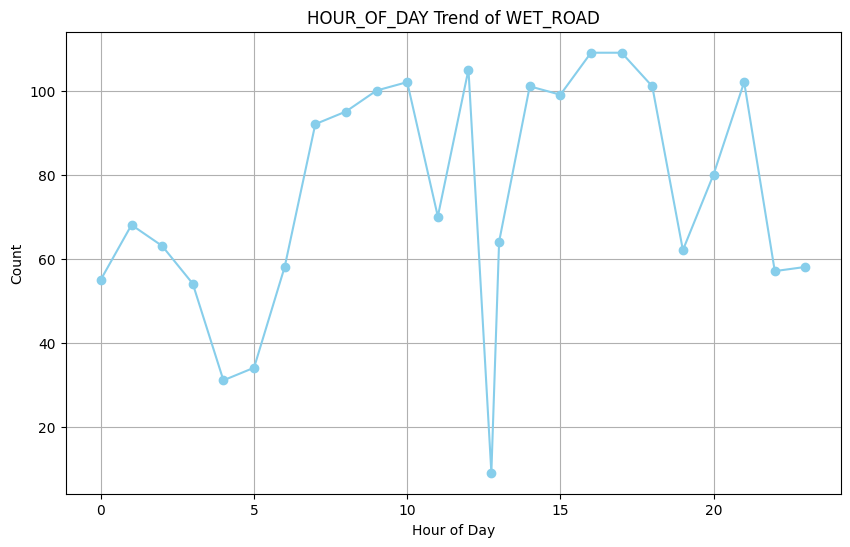

In [ ]:
time_series_data = df[['HOUR_OF_DAY', 'WET_ROAD']]
time_series_data = time_series_data.groupby('HOUR_OF_DAY')['WET_ROAD'].sum()

plt.figure(figsize=(10, 6))
time_series_data.plot(marker='o', color='skyblue', linestyle='-')
plt.title('HOUR_OF_DAY Trend of WET_ROAD')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.grid(True)
plt.show()

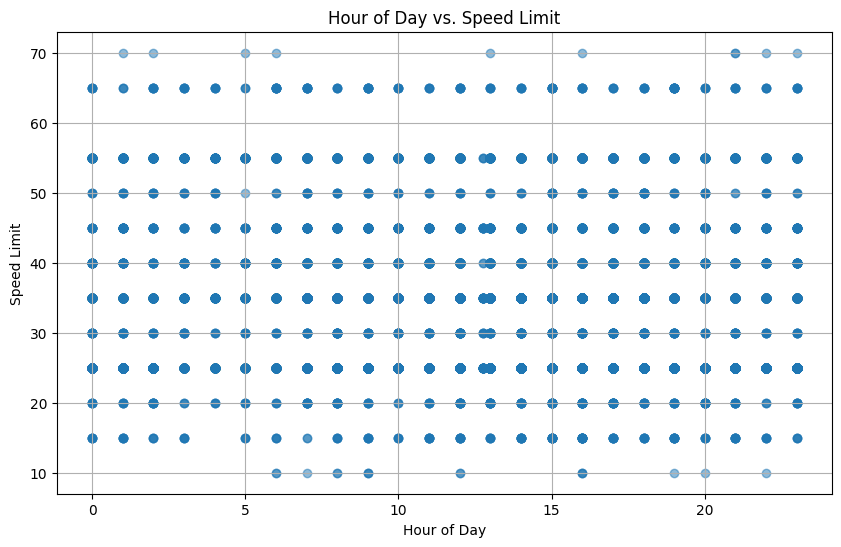

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(df['HOUR_OF_DAY'], df['SPEED_LIMIT'], alpha=0.5)
plt.title('Hour of Day vs. Speed Limit')
plt.xlabel('Hour of Day')
plt.ylabel('Speed Limit')
plt.grid(True)
plt.show()

### Causal Graphical Models

https://github.com/ijmbarr/causalgraphicalmodels/tree/master

Columns related to MAX_SEVERITY_LEVEL:

+ Time: CRASH_MONTH, DAY_OF_WEEK, HOUR_OF_DAY
+ Driving Environment: ILLUMINATION
+ Built environment: SPEED_LIMIT, WET_ROAD
+ Driver Behavior: ALCOHOL_RELATED, DRINKING_DRIVER, DRUG_RELATED, DRUGGED_DRIVER, CROSS_MEDIAN, UNBELTED
+ Socialeconomics

In [ ]:
from causalgraphicalmodels import CausalGraphicalModel

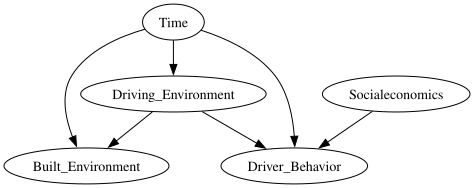

In [ ]:
crash = CausalGraphicalModel(
    nodes=['Time', 'Driving_Environment', 'Built_Environment', 'Driver_Behavior', 'Socialeconomics'],
    edges=[
        ('Time', 'Driving_Environment'),
        ('Time', 'Built_Environment'),
        ('Time', 'Driver_Behavior'),
        ('Driving_Environment', 'Built_Environment'),
        ('Driving_Environment', 'Driver_Behavior'),
        ('Driving_Environment', 'Driver_Behavior'),
        ('Socialeconomics', 'Driver_Behavior')
    ]
)
crash.draw()

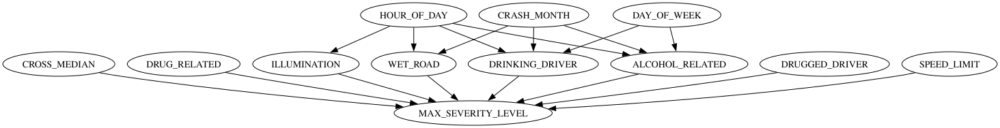

In [ ]:
crash_severity = CausalGraphicalModel(
    nodes=['CRASH_MONTH', 'DAY_OF_WEEK', 'HOUR_OF_DAY',
           'ILLUMINATION',
           'SPEED_LIMIT',
           'WET_ROAD',
           'ALCOHOL_RELATED', 'DRINKING_DRIVER', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'CROSS_MEDIAN',
           'MAX_SEVERITY_LEVEL'],
    edges=[
        ('CRASH_MONTH', 'WET_ROAD'),
        ('CRASH_MONTH', 'ALCOHOL_RELATED',),
        ('CRASH_MONTH', 'DRINKING_DRIVER'),
        ('DAY_OF_WEEK', 'ALCOHOL_RELATED'),
        ('DAY_OF_WEEK', 'DRINKING_DRIVER'),
        ('HOUR_OF_DAY', 'ILLUMINATION'),
        ('HOUR_OF_DAY', 'WET_ROAD'),
        ('HOUR_OF_DAY', 'ALCOHOL_RELATED'),
        ('HOUR_OF_DAY', 'DRINKING_DRIVER'),
        ('ILLUMINATION', 'MAX_SEVERITY_LEVEL'),
        ('SPEED_LIMIT', 'MAX_SEVERITY_LEVEL'),
        ('WET_ROAD', 'MAX_SEVERITY_LEVEL'),
        ('ALCOHOL_RELATED', 'MAX_SEVERITY_LEVEL'),
        ('DRINKING_DRIVER', 'MAX_SEVERITY_LEVEL'),
        ('DRUG_RELATED', 'MAX_SEVERITY_LEVEL'),
        ('DRUGGED_DRIVER', 'MAX_SEVERITY_LEVEL'),
        ('CROSS_MEDIAN', 'MAX_SEVERITY_LEVEL')
    ]
)

crash_severity.draw()